# Proyecto 03 - Procesamiento del Lenguaje Natural

## Dataset: The Multilingual Amazon Reviews Corpus

**Recuerda descargar el dataset de [aquí](https://github.com/kang205/SASRec). Es un archivo .zip que contiene tres documentos. Más información sobre el dataset [aquí](https://registry.opendata.aws/amazon-reviews-ml/). Es importante que tengas en cuenta la [licencia](https://docs.opendata.aws/amazon-reviews-ml/license.txt) de este dataset.**

### Exploración de datos y Procesamiento del Lenguaje Natural

Dedícale un buen tiempo a hacer un Análisis Exploratorio de Datos. Considera que hasta que no hayas aplicado las herramientas de Procesamiento del Lenguaje Natural vistas, será difícil completar este análisis. Elige preguntas que creas que puedas responder con este dataset. Por ejemplo, ¿qué palabras están asociadas a calificaciones positivas y qué palabras a calificaciones negativas?

### Machine Learning

Implementa un modelo que, dada la crítica de un producto, asigne la cantidad de estrellas correspondiente. **Para pensar**: ¿es un problema de Clasificación o de Regresión?

1. Haz todas las transformaciones de datos que consideres necesarias. Justifica.
1. Evalúa de forma apropiada sus resultados. Justifica la métrica elegida.
1. Elige un modelo benchmark y compara tus resultados con este modelo.
1. Optimiza los hiperparámetros de tu modelo.
1. Intenta responder la pregunta: ¿Qué información está usando el modelo para predecir?

**Recomendación:** si no te resulta conveniente trabajar en español con NLTK, te recomendamos que explores la librería [spaCy](https://spacy.io/).

### Para pensar, investigar y, opcionalmente, implementar
1. ¿Valdrá la pena convertir el problema de Machine Learning en un problema binario? Es decir, asignar únicamente las etiquetas Positiva y Negativa a cada crítica y hacer un modelo que, en lugar de predecir las estrellas, prediga esa etiqueta. Pensar en qué situación puede ser útil. ¿Esperas que el desempeño sea mejor o peor?
1. ¿Hay algo que te gustaría investigar o probar?

### **¡Tómate tiempo para investigar y leer mucho!**

In [243]:
# Herramientas de uso
import itertools

# Gemas del Infinito
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
sns.set()

# Adicionales
from matplotlib.ticker import ScalarFormatter

#Machine Learning


#NLP
import nltk

# Configuración NLTK
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to C:\Users\Jean Piere
[nltk_data]     Castro\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to C:\Users\Jean Piere
[nltk_data]     Castro\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

## Metodología de trabajo

Aqui irá un resumen de lo desarrollado

## 1. Exploración

### 1.1 Espacio de trabajo

* **Dataset Dev**

In [3]:
dataset_dev = pd.read_json('dataset_amazon/dataset_es_dev.json', lines= True)
dataset_dev.head()

,review_id,product_id,reviewer_id,stars,review_body,review_title,language,product_category
0,es_0417480,product_es_0873923,reviewer_es_0672978,1,"Malisimo, muy grande demasiado aparatoso y mal...",Mala compra,es,wireless
1,es_0180432,product_es_0713146,reviewer_es_0100858,1,No he recibido el pedido no la devolución,No lo he recibido,es,apparel
2,es_0144850,product_es_0356874,reviewer_es_0486447,1,"Tengo que buscar otro sistema, este no funcion...",Que no aprieta bien en el manillar,es,sports
3,es_0339629,product_es_0939832,reviewer_es_0894703,1,Utilicé las brocas de menor diámetro y se me d...,Brocas de mantequilla,es,home_improvement
4,es_0858362,product_es_0489066,reviewer_es_0887663,1,No me gusta su olor a viejo y aspecto malo,No me gusta,es,beauty


* **Dataset Train**

In [4]:
dataset_train = pd.read_json('dataset_amazon/dataset_es_train.json', lines= True)
dataset_train.head()

,review_id,product_id,reviewer_id,stars,review_body,review_title,language,product_category
0,es_0491108,product_es_0296024,reviewer_es_0999081,1,Nada bueno se me fue ka pantalla en menos de 8...,television Nevir,es,electronics
1,es_0869872,product_es_0922286,reviewer_es_0216771,1,"Horrible, nos tuvimos que comprar otro porque ...",Dinero tirado a la basura con esta compra,es,electronics
2,es_0811721,product_es_0474543,reviewer_es_0929213,1,Te obligan a comprar dos unidades y te llega s...,solo llega una unidad cuando te obligan a comp...,es,drugstore
3,es_0359921,product_es_0656090,reviewer_es_0224702,1,"No entro en descalificar al vendedor, solo pue...",PRODUCTO NO RECIBIDO.,es,wireless
4,es_0068940,product_es_0662544,reviewer_es_0224827,1,Llega tarde y co la talla equivocada,Devuelto,es,shoes


* **Dataset Test**

In [5]:
dataset_test = pd.read_json('dataset_amazon/dataset_es_test.json', lines= True)
dataset_test.head()

,review_id,product_id,reviewer_id,stars,review_body,review_title,language,product_category
0,es_0038754,product_es_0113523,reviewer_es_0580071,1,no me llego el articulo me lo mando por correo...,no me llego,es,wireless
1,es_0748979,product_es_0017036,reviewer_es_0819733,1,"la mensajería horrible, no compro mas",amazon sigue sin cumplir en las entregas,es,home
2,es_0411746,product_es_0138642,reviewer_es_0508607,1,Estoy muy decepcionado con el vendedor ya que ...,ESTAFA EN EL ENVÍO,es,toy
3,es_0786686,product_es_0170887,reviewer_es_0491157,1,Mi valoración no es sobre el producto sino sob...,Estafa de Amazon,es,home
4,es_0429700,product_es_0710642,reviewer_es_0008745,1,Pues tenía interés en este libro y probé la ve...,No conseguí pasar de la portada en Kindle,es,digital_ebook_purchase


### 1.2 Exploración inicial

Número de instancias en el dataset:

In [6]:
dataset_dev.shape

(5000, 8)

In [7]:
dataset_train.shape

(200000, 8)

In [8]:
dataset_test.shape

(5000, 8)

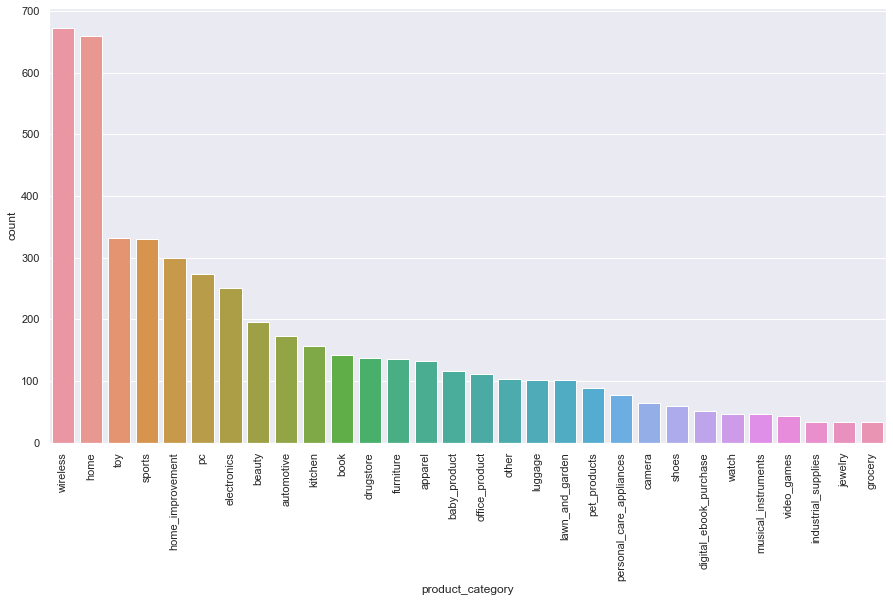

In [9]:
plt.figure(figsize = (15,8))
plot = sns.countplot(data=dataset_dev, x='product_category',order = dataset_dev.product_category.value_counts().index)
for item in plot.get_xticklabels():
    item.set_rotation(90)
plt.show()

Se encuentra que la principal categoria de reseñas correspontes a wireless, home, toy, sports y home_improvement. Ahora buscaremos dividir el dataset según el número de estrellas y ubicar qué categorias son populares a partir de la calificación.

## 1.2 Exploracion por calificacion

#### Categorias populares con 1 estrella

In [10]:
one_star = dataset_dev[dataset_dev.stars==1]
one_star.head()

,review_id,product_id,reviewer_id,stars,review_body,review_title,language,product_category
0,es_0417480,product_es_0873923,reviewer_es_0672978,1,"Malisimo, muy grande demasiado aparatoso y mal...",Mala compra,es,wireless
1,es_0180432,product_es_0713146,reviewer_es_0100858,1,No he recibido el pedido no la devolución,No lo he recibido,es,apparel
2,es_0144850,product_es_0356874,reviewer_es_0486447,1,"Tengo que buscar otro sistema, este no funcion...",Que no aprieta bien en el manillar,es,sports
3,es_0339629,product_es_0939832,reviewer_es_0894703,1,Utilicé las brocas de menor diámetro y se me d...,Brocas de mantequilla,es,home_improvement
4,es_0858362,product_es_0489066,reviewer_es_0887663,1,No me gusta su olor a viejo y aspecto malo,No me gusta,es,beauty


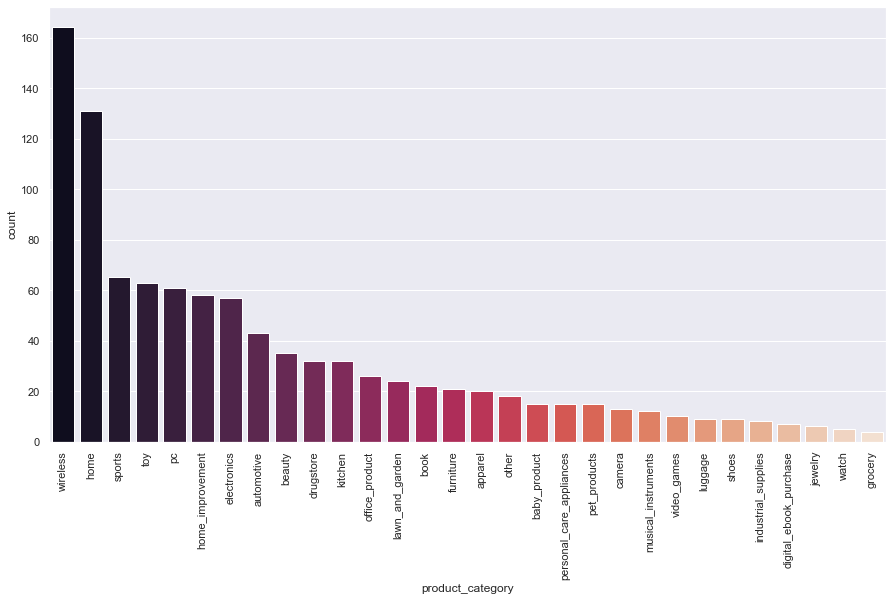

In [11]:
plt.figure(figsize = (15,8))
plot = sns.countplot(data=one_star, x='product_category',order = one_star.product_category.value_counts().index,palette='rocket')
for item in plot.get_xticklabels():
    item.set_rotation(90)
plt.show()

#### Categorias populares con 2 estrella

In [12]:
two_star = dataset_dev[dataset_dev.stars==2]
two_star.head()

,review_id,product_id,reviewer_id,stars,review_body,review_title,language,product_category
1000,es_0118732,product_es_0968323,reviewer_es_0145809,2,Me han enviado algo completamente diferente. E...,Muy mal,es,home
1001,es_0696968,product_es_0860895,reviewer_es_0999762,2,En menos de 2 semanas de uso una de las mangas...,Baja calidad de producto,es,kitchen
1002,es_0874902,product_es_0170859,reviewer_es_0981966,2,"Hicimos el pedido de la barrera, hasta ahí tod...",Decepcionados con el embalaje y el estado del ...,es,baby_product
1003,es_0773654,product_es_0429247,reviewer_es_0191603,2,Queda grande no es una S pero se puede arregla...,Mas o menos,es,apparel
1004,es_0532571,product_es_0293429,reviewer_es_0799746,2,En 5 días de uso se ha roto el pulsador de pue...,Poca calidad,es,home_improvement


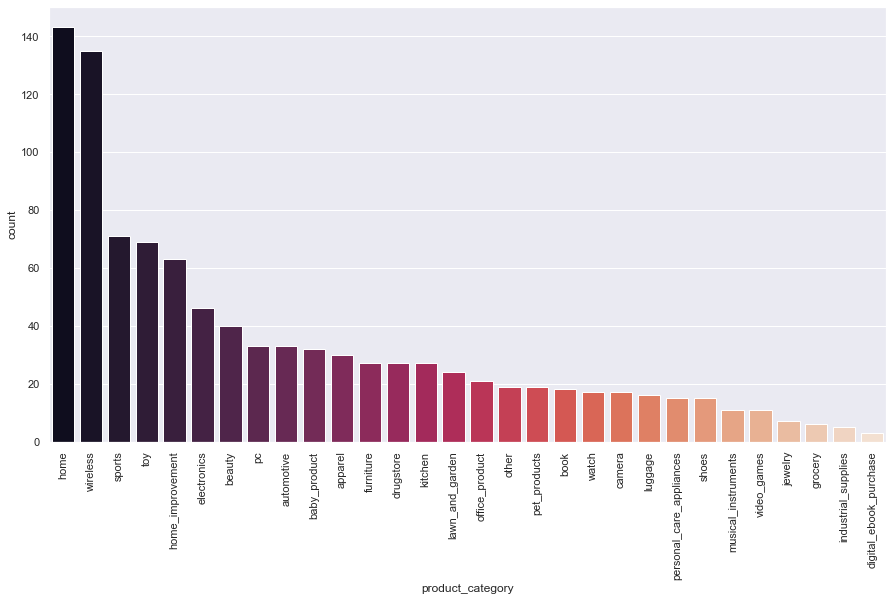

In [13]:
plt.figure(figsize = (15,8))
plot = sns.countplot(data=two_star, x='product_category',order = two_star.product_category.value_counts().index,palette='rocket')
for item in plot.get_xticklabels():
    item.set_rotation(90)
plt.show()

#### Categorias populares con 3 estrella

In [14]:
three_star = dataset_dev[dataset_dev.stars==3]
three_star.head()

,review_id,product_id,reviewer_id,stars,review_body,review_title,language,product_category
2000,es_0176929,product_es_0553307,reviewer_es_0240217,3,"Nos gusto por su color, tejido y calidad de es...",Encaja,es,lawn_and_garden
2001,es_0032372,product_es_0720285,reviewer_es_0348916,3,"Ha llegado rápido. , Es más pequeña de lo que ...",Simple.,es,luggage
2002,es_0446630,product_es_0413759,reviewer_es_0118864,3,Me ha gustado el producto,Buen producto,es,watch
2003,es_0001452,product_es_0619908,reviewer_es_0037222,3,"se despega rápido, lo que he hecho ha sido coc...",bien,es,kitchen
2004,es_0315490,product_es_0435465,reviewer_es_0988902,3,no parece tampoco muy especifico para animales...,BASICO,es,drugstore


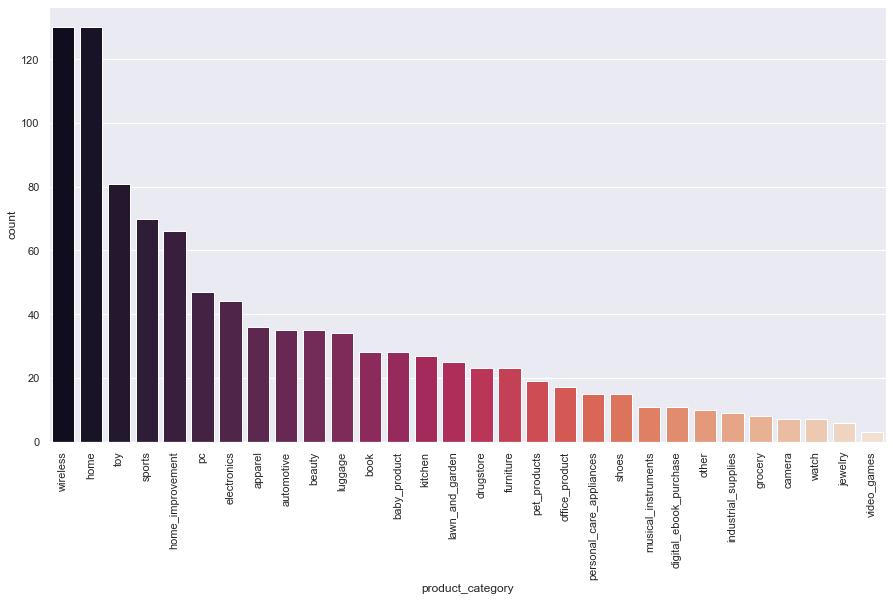

In [15]:
plt.figure(figsize = (15,8))
plot = sns.countplot(data=three_star, x='product_category',order = three_star.product_category.value_counts().index,palette='rocket')
for item in plot.get_xticklabels():
    item.set_rotation(90)
plt.show()

#### Categorias populares con 4 estrella

In [16]:
four_star = dataset_dev[dataset_dev.stars==4]
four_star.head()

,review_id,product_id,reviewer_id,stars,review_body,review_title,language,product_category
3000,es_0638126,product_es_0921838,reviewer_es_0467790,4,Son robustas y francamente cumplen con su come...,Gran juego de llaves.,es,home_improvement
3001,es_0957542,product_es_0016810,reviewer_es_0205107,4,Estupenda relación calidad-precio,Funcional,es,home_improvement
3002,es_0571992,product_es_0161938,reviewer_es_0304170,4,Lo compré para mi madre. Esta muy contenta. Es...,compacto y cómodo,es,furniture
3003,es_0469900,product_es_0182832,reviewer_es_0562273,4,"UN POCO ESTRECHO ,PERO VALE PARA LO QUE ES,PAR...",ESTA BIEN,es,home_improvement
3004,es_0832100,product_es_0922601,reviewer_es_0049840,4,Le doy cuatro estrellas porque aún no lo he pr...,Nice.,es,wireless


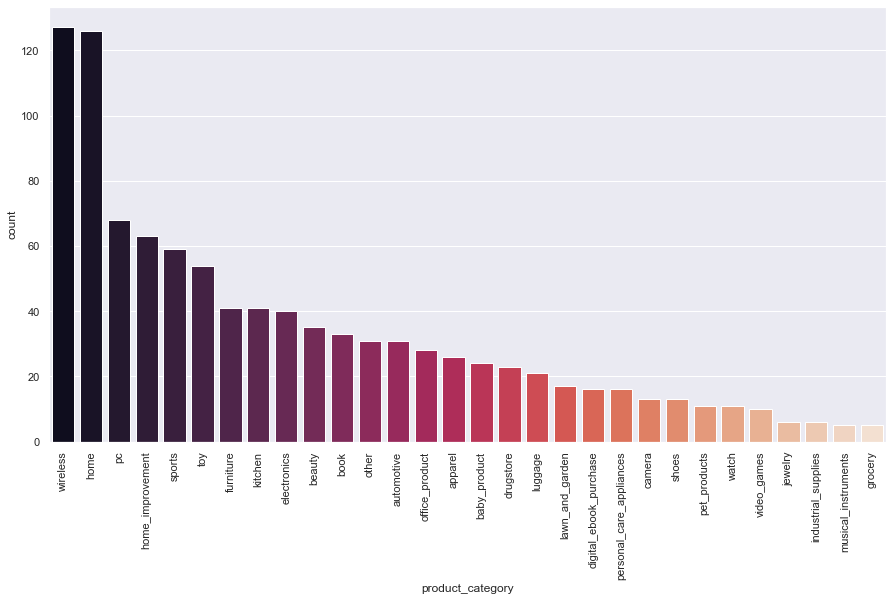

In [17]:
plt.figure(figsize = (15,8))
plot = sns.countplot(data=four_star, x='product_category',order = four_star.product_category.value_counts().index,palette='rocket')
for item in plot.get_xticklabels():
    item.set_rotation(90)
plt.show()

#### Categorias populares con 5 estrella

In [18]:
five_star = dataset_dev[dataset_dev.stars==5]
five_star.head()

,review_id,product_id,reviewer_id,stars,review_body,review_title,language,product_category
4000,es_0973261,product_es_0163826,reviewer_es_0461590,5,"Mi pareja encantada con esta adquisición, prác...","Muy Útil, ligero y hace su papel para lo que es",es,toy
4001,es_0285657,product_es_0396230,reviewer_es_0837511,5,En cuanto lo compré mi gato se olvidó de rasca...,Funciona,es,pet_products
4002,es_0777148,product_es_0566248,reviewer_es_0269131,5,Café de excelente calidad. Las cápsulas sin al...,Cápsulas compatibles con maquina nespresso rec...,es,grocery
4003,es_0554747,product_es_0244949,reviewer_es_0800916,5,Te atrapa desde el primer minuto!!! Lectura fá...,Te atrapa,es,digital_ebook_purchase
4004,es_0685602,product_es_0991354,reviewer_es_0579306,5,"Está muy bien montado, y resulta muy vistoso. ...",que sea lo pedido,es,jewelry


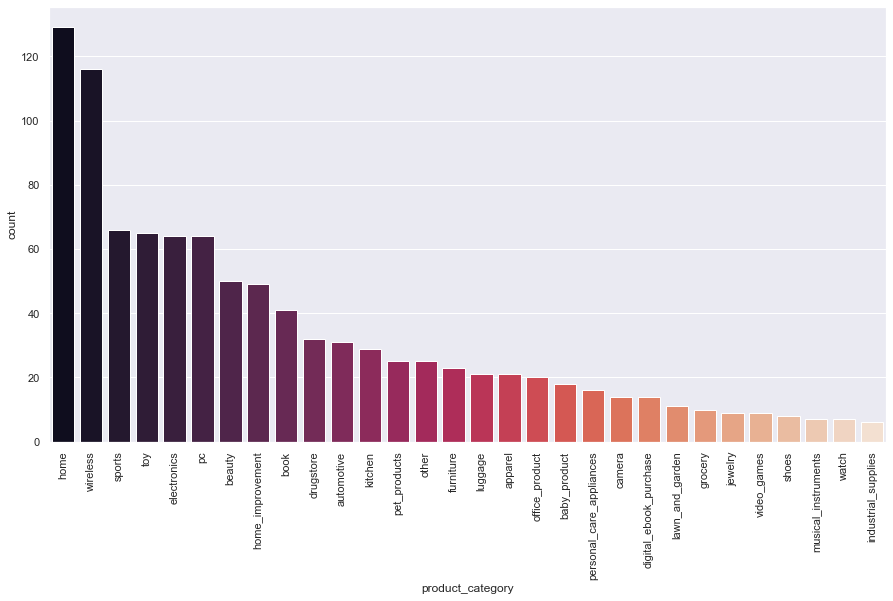

In [19]:
plt.figure(figsize = (15,8))
plot = sns.countplot(data=five_star, x='product_category',order = five_star.product_category.value_counts().index,palette='rocket')
for item in plot.get_xticklabels():
    item.set_rotation(90)
plt.show()

Observamos que sin distincion a la clasificacion, las categorias parecen seguir el mismo comportamiento. 

Este comportamiento nos indica que el numero de estrellas no esta muy relacionado a la categoria de un producto. Esto es, productos de x o y categoria no se distinguen por su alto/bajo calificacion.

## 2. Analisis exploratorio de reviews y title reviews

In [20]:
#funcion tokenizador de texto entrega una lista flatteada con todos los tokens 
def tokenizer(data,columna):
    data['text']=data[columna].apply(lambda x:x.lower())
    data['text']=data['text'].apply(lambda x: nltk.tokenize.RegexpTokenizer("[\w]+").tokenize(x))
    return data['text']

In [21]:
m=tokenizer(dataset_dev,'review_body')

In [22]:
m.values.tolist()

[['malisimo',
  'muy',
  'grande',
  'demasiado',
  'aparatoso',
  'y',
  'mal',
  'protector',
  'de',
  'pantalla'],
 ['no', 'he', 'recibido', 'el', 'pedido', 'no', 'la', 'devolución'],
 ['tengo',
  'que',
  'buscar',
  'otro',
  'sistema',
  'este',
  'no',
  'funciona',
  'muy',
  'bien',
  'la',
  'abrazadera',
  'que',
  'lleva',
  'para',
  'agarrar',
  'el',
  'manillar',
  'no',
  'aprieta',
  'bien',
  'sobre',
  'este',
  'deslizando',
  'la',
  'linterna',
  'hacia',
  'abajo'],
 ['utilicé',
  'las',
  'brocas',
  'de',
  'menor',
  'diámetro',
  'y',
  'se',
  'me',
  'doblaron',
  'varias',
  'como',
  'si',
  'fuesen',
  'de',
  'mantequilla',
  'al',
  'hacer',
  'una',
  'mínima',
  'presión',
  'sobre',
  'ellas',
  'una',
  'vez',
  'dobladas',
  'al',
  'intentar',
  'enderezarlas',
  'se',
  'parten',
  'exteriormente',
  'son',
  'amarillas',
  'pero',
  'el',
  'interior',
  'es',
  'como',
  'de',
  'un',
  'fundido',
  'gris',
  'la',
  'peor',
  'compra',
  'q

## 2.1 Exploracion de title Review

In [23]:
dataset_dev.head()

,review_id,product_id,reviewer_id,stars,review_body,review_title,language,product_category,text
0,es_0417480,product_es_0873923,reviewer_es_0672978,1,"Malisimo, muy grande demasiado aparatoso y mal...",Mala compra,es,wireless,"[malisimo, muy, grande, demasiado, aparatoso, ..."
1,es_0180432,product_es_0713146,reviewer_es_0100858,1,No he recibido el pedido no la devolución,No lo he recibido,es,apparel,"[no, he, recibido, el, pedido, no, la, devoluc..."
2,es_0144850,product_es_0356874,reviewer_es_0486447,1,"Tengo que buscar otro sistema, este no funcion...",Que no aprieta bien en el manillar,es,sports,"[tengo, que, buscar, otro, sistema, este, no, ..."
3,es_0339629,product_es_0939832,reviewer_es_0894703,1,Utilicé las brocas de menor diámetro y se me d...,Brocas de mantequilla,es,home_improvement,"[utilicé, las, brocas, de, menor, diámetro, y,..."
4,es_0858362,product_es_0489066,reviewer_es_0887663,1,No me gusta su olor a viejo y aspecto malo,No me gusta,es,beauty,"[no, me, gusta, su, olor, a, viejo, y, aspecto..."


In [24]:
dataset_dev.language.value_counts()

es    5000
Name: language, dtype: int64

In [25]:
stopwords = nltk.corpus.stopwords.words('spanish')

In [26]:
stopwords

['de',
 'la',
 'que',
 'el',
 'en',
 'y',
 'a',
 'los',
 'del',
 'se',
 'las',
 'por',
 'un',
 'para',
 'con',
 'no',
 'una',
 'su',
 'al',
 'lo',
 'como',
 'más',
 'pero',
 'sus',
 'le',
 'ya',
 'o',
 'este',
 'sí',
 'porque',
 'esta',
 'entre',
 'cuando',
 'muy',
 'sin',
 'sobre',
 'también',
 'me',
 'hasta',
 'hay',
 'donde',
 'quien',
 'desde',
 'todo',
 'nos',
 'durante',
 'todos',
 'uno',
 'les',
 'ni',
 'contra',
 'otros',
 'ese',
 'eso',
 'ante',
 'ellos',
 'e',
 'esto',
 'mí',
 'antes',
 'algunos',
 'qué',
 'unos',
 'yo',
 'otro',
 'otras',
 'otra',
 'él',
 'tanto',
 'esa',
 'estos',
 'mucho',
 'quienes',
 'nada',
 'muchos',
 'cual',
 'poco',
 'ella',
 'estar',
 'estas',
 'algunas',
 'algo',
 'nosotros',
 'mi',
 'mis',
 'tú',
 'te',
 'ti',
 'tu',
 'tus',
 'ellas',
 'nosotras',
 'vosotros',
 'vosotras',
 'os',
 'mío',
 'mía',
 'míos',
 'mías',
 'tuyo',
 'tuya',
 'tuyos',
 'tuyas',
 'suyo',
 'suya',
 'suyos',
 'suyas',
 'nuestro',
 'nuestra',
 'nuestros',
 'nuestras',
 'vuestro'

In [27]:
def words_processing(data,columna):
    stopwd=nltk.corpus.stopwords.words('spanish')
    tokenizado=tokenizer(data,columna)
    flatten_text=[word for lista in tokenizado.values for word in lista]
    content=[word for word in flatten_text if word not in stopwd]
    print(f'El porcentaje de palabras a procesar equivale a: {len(content)/len(flatten_text) *100} %')  
    return content
                                                                

In [28]:
#Veamos el porcentaje de palabras que tenemos para procesar 
words_usefull=words_processing(dataset_dev,'review_title')

El porcentaje de palabras a procesar equivale a: 62.56225622562256 %


In [29]:
title_reviews = []
calification = []
for i in range(dataset_dev.shape[0]):
    title = dataset_dev.iloc[i].review_title.lower()
    star = dataset_dev.iloc[i].stars
    title = nltk.tokenize.RegexpTokenizer("[\w]+").tokenize(title)
    title = [word for word in title if word not in stopwords]

    title_reviews.append(title)
    calification.append(star)

In [30]:
title_reviews

[['mala', 'compra'],
 ['recibido'],
 ['aprieta', 'bien', 'manillar'],
 ['brocas', 'mantequilla'],
 ['gusta'],
 ['bolas', 'rotas'],
 ['parte', 'poder', 'elegir', 'color'],
 ['tapa', 'pantalla'],
 ['recibido', 'producto'],
 ['patata'],
 ['desliza', 'hacia', 'abajo', 'rato'],
 ['comprar'],
 ['recoge'],
 ['sirve'],
 ['endeble'],
 ['nunca', 'entregaron', 'juegos'],
 ['malo'],
 ['bolsitas'],
 ['llegado'],
 ['recomiendo'],
 ['coronas'],
 ['resistente'],
 ['mamá'],
 ['embalaje', 'directamente', 'caja'],
 ['malisimo'],
 ['estafa'],
 ['material', 'poca', 'calidad'],
 ['cubierta', 'asiento'],
 ['funciona'],
 ['difícil', 'limpiar'],
 ['deja', 'funcionar'],
 ['pequeños'],
 ['exploto', 'nunca', 'repusieron'],
 ['mala', 'calidad'],
 ['mala', 'calidad'],
 ['alimentador', 'soporte'],
 ['van', 'conos'],
 ['recibido', 'paquete'],
 ['paga', 'devoluciones'],
 ['producto', 'averiado'],
 ['funcionado', 'primer', 'momento'],
 [],
 ['endeble'],
 ['volvere', 'comprar'],
 ['producto', 'usado', 'incompleto'],
 ['

In [31]:
title_reviews = list(itertools.chain(*title_reviews))
title_reviews[0:12]

['mala',
 'compra',
 'recibido',
 'aprieta',
 'bien',
 'manillar',
 'brocas',
 'mantequilla',
 'gusta',
 'bolas',
 'rotas',
 'parte']

In [32]:
freq_tl = nltk.FreqDist(title_reviews)
freq_tl

FreqDist({'calidad': 401, 'bien': 309, 'buena': 237, 'precio': 230, 'producto': 190, 'buen': 189, 'mal': 108, 'mala': 104, 'perfecto': 102, 'bueno': 85, ...})

In [33]:
df_tl = pd.DataFrame(list(freq_tl.items()), columns = ["Word","W_Frequency"])
df_tl.head()

,Word,W_Frequency
0,mala,104
1,compra,83
2,recibido,18
3,aprieta,1
4,bien,309


In [34]:
df_tl.sort_values('W_Frequency',ascending=False, inplace = True)
df_tl.head()

,Word,W_Frequency
44,calidad,401
4,bien,309
273,buena,237
503,precio,230
17,producto,190


In [35]:
df_tl.reset_index(drop = True, inplace=True)
df_tl.head()

,Word,W_Frequency
0,calidad,401
1,bien,309
2,buena,237
3,precio,230
4,producto,190


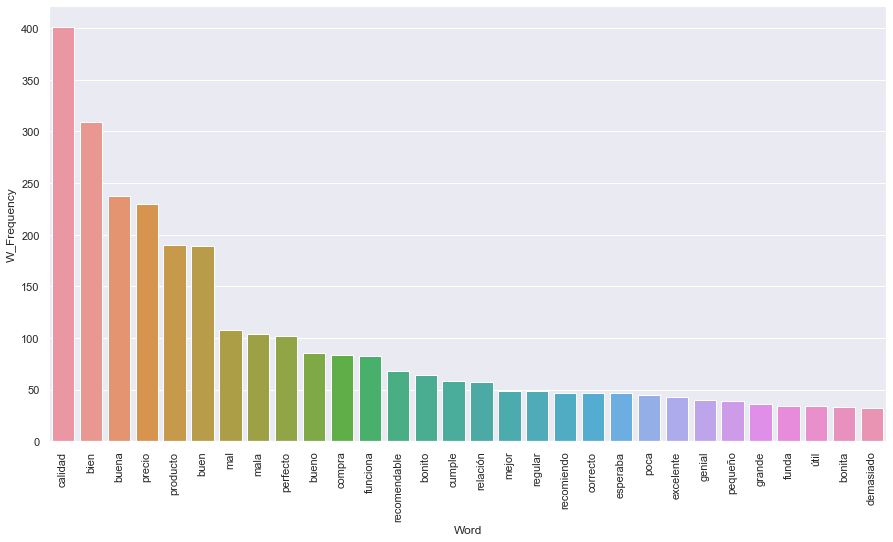

In [36]:
plt.figure(figsize = (15,8))
plot = sns.barplot(x  = df_tl.iloc[:30].Word, y = df_tl.iloc[:30].W_Frequency)
for item in plot.get_xticklabels():
    item.set_rotation(90)
plt.show()

Se observan las palabrás más frecuentes en los títulos de los reviews. Aunque esta gráfica no nos permite diferenciar cuales se refieren a críticas buenas o malas.

Se definira una funcion que nos permite realizar el tokenizado clasificando a partir del numero de estrellas.

In [37]:
def token_npl(dataset, stopwords, star):
    title_reviews = []
    calification = []
    for i in range(dataset.shape[0]):
        title = dataset.iloc[i].review_title.lower()
        title = nltk.tokenize.RegexpTokenizer("[\w]+").tokenize(title)
        title = [word for word in title if word not in stopwords]

        title_reviews.append(title)
        calification.append(star)
        
    title_reviews = list(itertools.chain(*title_reviews))
    freq_tl = nltk.FreqDist(title_reviews)
    df_tl = pd.DataFrame(list(freq_tl.items()), columns = ["Word","Frequency"])
    df_tl['Calification'] = star
    df_tl.sort_values('Frequency',ascending=False, inplace = True)
    df_tl.reset_index(drop = True, inplace=True)
        
    return df_tl

In [38]:
df_one = token_npl(one_star, stopwords, 1)
df_one.head(5)

,Word,Frequency,Calification
0,calidad,55,1
1,producto,52,1
2,mala,48,1
3,mal,37,1
4,funciona,27,1


In [39]:
df_two = token_npl(two_star, stopwords, 2)
df_two.head()

,Word,Frequency,Calification
0,calidad,85,2
1,bien,52,2
2,mala,46,2
3,mal,29,2
4,producto,23,2


In [40]:
df_three = token_npl(three_star, stopwords, 3)
df_three.head()

,Word,Frequency,Calification
0,bien,97,3
1,calidad,66,3
2,precio,58,3
3,mal,36,3
4,buena,35,3


In [41]:
df_three = token_npl(three_star, stopwords, 3)
df_three.head()

,Word,Frequency,Calification
0,bien,97,3
1,calidad,66,3
2,precio,58,3
3,mal,36,3
4,buena,35,3


In [42]:
df_four = token_npl(four_star, stopwords, 4)
df_four.head()

,Word,Frequency,Calification
0,buena,110,4
1,bien,99,4
2,calidad,99,4
3,precio,90,4
4,buen,70,4


In [43]:
df_five = token_npl(five_star, stopwords, 5)
df_five.head()

,Word,Frequency,Calification
0,calidad,96,5
1,buen,84,5
2,buena,74,5
3,perfecto,70,5
4,precio,53,5


Se encuentra que los titulos de los reviews no se encuentran palabras relevantes en relacion a la calificacion que el usuario le da al producto. Por el contrario, se repiten palabras independientemente de la calificacion. Por lo que esta columna de los datos puede darnos un panorama confuso al momento de entrenar el modelo.
Sin embargo un analisis de ngramas pueden darnos alguna idea de las frases que se repiten comunmente en los comentarios buenos y malos. 

Vamos a dividir el dataset en dos segun la calificacion que se dio, para ello definiremos bueno calificaciones mayores a 3 y malos 3 o menor.

In [44]:
good = dataset_dev[dataset_dev.stars>=3]
bad=dataset_dev[dataset_dev.stars<3]
bad

,review_id,product_id,reviewer_id,stars,review_body,review_title,language,product_category,text
0,es_0417480,product_es_0873923,reviewer_es_0672978,1,"Malisimo, muy grande demasiado aparatoso y mal...",Mala compra,es,wireless,"[mala, compra]"
1,es_0180432,product_es_0713146,reviewer_es_0100858,1,No he recibido el pedido no la devolución,No lo he recibido,es,apparel,"[no, lo, he, recibido]"
2,es_0144850,product_es_0356874,reviewer_es_0486447,1,"Tengo que buscar otro sistema, este no funcion...",Que no aprieta bien en el manillar,es,sports,"[que, no, aprieta, bien, en, el, manillar]"
3,es_0339629,product_es_0939832,reviewer_es_0894703,1,Utilicé las brocas de menor diámetro y se me d...,Brocas de mantequilla,es,home_improvement,"[brocas, de, mantequilla]"
4,es_0858362,product_es_0489066,reviewer_es_0887663,1,No me gusta su olor a viejo y aspecto malo,No me gusta,es,beauty,"[no, me, gusta]"
...,...,...,...,...,...,...,...,...,...
1995,es_0030937,product_es_0714707,reviewer_es_0625309,2,"Son muy pequeños,pensé que eran más grandes. N...",Ana Maria,es,jewelry,"[ana, maria]"
1996,es_0056828,product_es_0000924,reviewer_es_0953528,2,Es la segunda vez que lo compro. La primera ve...,Capsulas Café,es,grocery,"[capsulas, café]"
1997,es_0461030,product_es_0254933,reviewer_es_0016628,2,"Tengo que decir que el aparato va bien, pero a...",NO ME HA FUNCIONADO,es,personal_care_appliances,"[no, me, ha, funcionado]"
1998,es_0956731,product_es_0005514,reviewer_es_0637278,2,Para bebés nada preciso. No lo recomiendo nada...,No recomendado para bebes,es,personal_care_appliances,"[no, recomendado, para, bebes]"


In [45]:
#Funcion para dividir los titulos en ngramas 
from nltk.util import ngrams
def ngramas(tokens_list_flatten,ngrama):
    #construimos los ngrams
    ngramas=list(ngrams(tokens_list_flatten,ngrama))
    fdist_n=nltk.FreqDist(ngramas)
    return fdist_n
   

In [46]:
def grafica_ngramas(fdist_n,n):
    print(f'Los n ngramas mas comunes son: \n {fdist_n.most_common(n)}\n')
    print('Grafica de los ngramas mas comunes')
    fdist_n.plot(n)

## Ngramas para comentarios con calificación buena

In [47]:
#Palabras a procesar
text_review_flatten=words_processing(good,'review_body')

<ipython-input-20-0364dec16bf5>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['text']=data[columna].apply(lambda x:x.lower())
<ipython-input-20-0364dec16bf5>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['text']=data['text'].apply(lambda x: nltk.tokenize.RegexpTokenizer("[\w]+").tokenize(x))


El porcentaje de palabras a procesar equivale a: 49.02191219956024 %


Los n ngramas mas comunes son: 
 [(('calidad', 'precio'), 172), (('buena', 'calidad'), 140), (('relación', 'calidad'), 84), (('buen', 'producto'), 66), (('funciona', 'bien'), 62), (('va', 'bien'), 54), (('bastante', 'bien'), 43), (('cumple', 'función'), 40), (('buena', 'compra'), 37), (('buen', 'precio'), 35)]

Grafica de los ngramas mas comunes


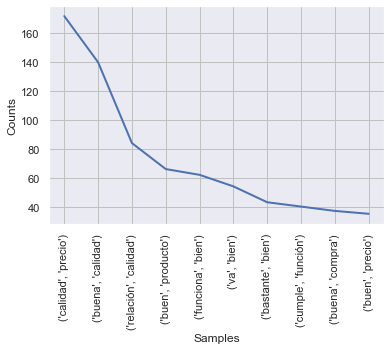

In [48]:
fdist_n=ngramas(text_review_flatten,2)
grafica_ngramas(fdist_n,10)

Los n ngramas mas comunes son: 
 [(('relación', 'calidad', 'precio'), 84), (('buena', 'relación', 'calidad'), 33), (('calidad', 'precio', 'bien'), 16), (('buena', 'calidad', 'precio'), 16), (('calidad', 'precio', 'buena'), 14), (('doy', '5', 'estrellas'), 10), (('precio', 'puede', 'pedir'), 10), (('relacion', 'calidad', 'precio'), 9), (('parece', 'buena', 'calidad'), 9), (('cumple', 'perfectamente', 'función'), 8)]

Grafica de los ngramas mas comunes


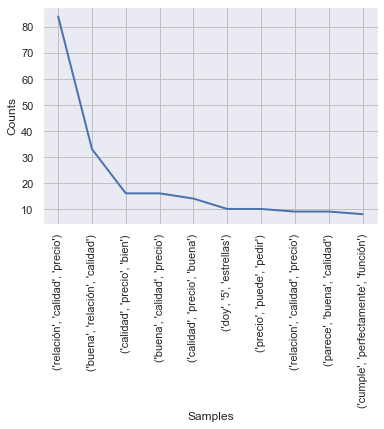

In [49]:
#trigramas
fdist_n=ngramas(text_review_flatten,3)
grafica_ngramas(fdist_n,10)

## Ngramas para comentarios con calificacion mala 

<ipython-input-20-0364dec16bf5>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['text']=data[columna].apply(lambda x:x.lower())
<ipython-input-20-0364dec16bf5>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['text']=data['text'].apply(lambda x: nltk.tokenize.RegexpTokenizer("[\w]+").tokenize(x))


El porcentaje de palabras a procesar equivale a: 47.71839880487557 %
Los n ngramas mas comunes son: 
 [(('mala', 'calidad'), 43), (('funciona', 'bien'), 24), (('volvería', 'comprar'), 22), (('calidad', 'precio'), 21), (('buena', 'calidad'), 21), (('primera', 'vez'), 21), (('baja', 'calidad'), 17), (('dos', 'meses'), 16), (('dos', 'veces'), 16), (('va', 'bien'), 16)]

Grafica de los ngramas mas comunes


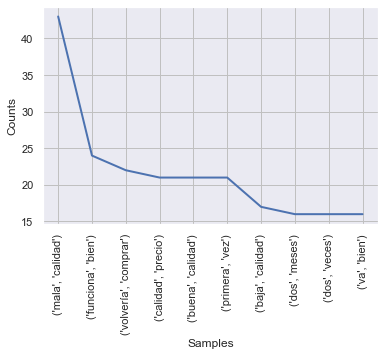

In [50]:
#bigrama
text_review_flatten=words_processing(bad,'review_body')
fdist_n=ngramas(text_review_flatten,2)
grafica_ngramas(fdist_n,10)

Los n ngramas mas comunes son: 
 [(('relación', 'calidad', 'precio'), 9), (('precio', 'puede', 'pedir'), 7), (('cada', 'dos', 'tres'), 5), (('peor', 'compra', 'hecho'), 4), (('barato', 'sale', 'caro'), 4), (('puedo', 'opinar', 'producto'), 4), (('pongo', '2', 'estrellas'), 4), (('producto', 'mala', 'calidad'), 3), (('cubre', 'toda', 'pantalla'), 3), (('6', 'meses', 'uso'), 3)]

Grafica de los ngramas mas comunes


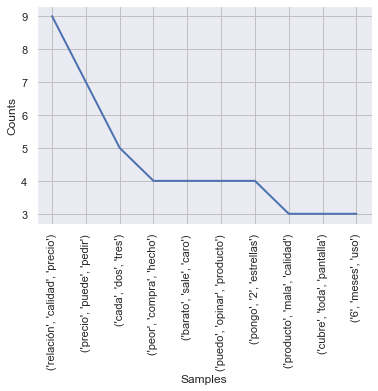

In [51]:
#trigrama
fdist_n=ngramas(text_review_flatten,3)
grafica_ngramas(fdist_n,10)

Con el analisis de ngramas podemos ver frases comunes que en el lenguaje natural explican el porque de la calificación buena o mala de cada item. 

Ahora analizaremos el review body para descubrir colocaciones que nos ayuden a encontrar patrones del lenguaje en ambos datasets "good" y "bad"

In [52]:
#definamos una funcion para encontrar las colocaciones de dos o mas palabras 
import plotly.express as px
def colocaciones(data):
    review_bodies = []
    calification = []
    for i in range(data.shape[0]):
        review = data.iloc[i].review_body.lower()
        star = data.iloc[i].stars
        review = nltk.tokenize.RegexpTokenizer("[\w]+").tokenize(review)
        review = [word for word in review if word not in stopwords]

        review_bodies.append(review)
        calification.append(star)

    #Separamos por palabras 
    reviews_flatten= [word for l in review_bodies for word in l]
    #construimos los ngrams
    trigramas=list(ngrams(reviews_flatten,3))
    trigramas_df=pd.DataFrame()
    trigramas_df['trigramas']=list(set(trigramas))
    trigramas_df['word_1']=trigramas_df['trigramas'].apply(lambda x: x[0])
    trigramas_df['word_2']=trigramas_df['trigramas'].apply(lambda x: x[1])
    trigramas_df['word_3']=trigramas_df['trigramas'].apply(lambda x: x[2])
    #conteo para sacar el PMI pointwise mutual information
    fdist_trigram=nltk.FreqDist(trigramas)
    fdist_palabra=nltk.FreqDist(reviews_flatten)

    trigramas_df['frec_trigram']=trigramas_df['trigramas'].apply(lambda x:fdist_trigram[x])
    trigramas_df['frec_word_1']=trigramas_df['word_1'].apply(lambda x:fdist_palabra[x])
    trigramas_df['frec_word_2']=trigramas_df['word_2'].apply(lambda x:fdist_palabra[x])
    trigramas_df['frec_word_3']=trigramas_df['word_3'].apply(lambda x:fdist_palabra[x])

    #calcular el PMI metrica de colocacion 
    trigramas_df['PMI']=trigramas_df[['frec_trigram','frec_word_1','frec_word_2']].apply(lambda x:np.log2(x[0]/(x[1]*x[2])),axis=1)
    
    #ver graficamente las colocaciones
    trigramas_df['log_frec_trigram']=trigramas_df['frec_trigram'].apply(lambda x: np.log2(x))
    fig=px.scatter(x=trigramas_df.PMI , y=trigramas_df.log_frec_trigram ,color=trigramas_df.PMI+trigramas_df.log_frec_trigram , hover_name=trigramas_df.trigramas , width=600 , height=600, labels={'x':'PMI','y':'Frecuencia'} )
    fig.show()
    return trigramas_df.sort_values('PMI',ascending=False)


In [53]:
colocaciones(good)


,trigramas,word_1,word_2,word_3,frec_trigram,frec_word_1,frec_word_2,frec_word_3,PMI,log_frec_trigram
32341,"(complicaciones, seguirla, recopilación)",complicaciones,seguirla,recopilación,1,1,1,1,0.000000,0.0
16989,"(entregarían, martes, entreguen)",entregarían,martes,entreguen,1,1,1,2,0.000000,0.0
3195,"(grabarlo, nuevamente, español)",grabarlo,nuevamente,español,1,1,1,20,0.000000,0.0
24143,"(ñapa, cúpula, si)",ñapa,cúpula,si,1,1,1,333,0.000000,0.0
8439,"(aplificador, smsl, 160)",aplificador,smsl,160,1,1,1,1,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...
28309,"(calidad, bien, calidad)",calidad,bien,calidad,1,549,977,549,-19.032877,0.0
5729,"(bien, calidad, producto)",bien,calidad,producto,1,977,549,306,-19.032877,0.0
36479,"(calidad, bien, precio)",calidad,bien,precio,1,549,977,466,-19.032877,0.0
26592,"(bien, calidad, justa)",bien,calidad,justa,1,977,549,9,-19.032877,0.0


In [54]:
colocaciones(bad)

,trigramas,word_1,word_2,word_3,frec_trigram,frec_word_1,frec_word_2,frec_word_3,PMI,log_frec_trigram
7915,"(dejas, 4h, dice)",dejas,4h,dice,1,1,1,26,0.000000,0.0
10779,"(2ds, gustará, 3d)",2ds,gustará,3d,1,1,1,3,0.000000,0.0
516,"(reconocer, windows, 30)",reconocer,windows,30,1,1,1,13,0.000000,0.0
27183,"(alfombra, enano, primero)",alfombra,enano,primero,1,1,1,16,0.000000,0.0
8827,"(desaparece, elimina, archivos)",desaparece,elimina,archivos,1,1,1,2,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...
25072,"(producto, bien, atención)",producto,bien,atención,1,299,351,14,-16.679329,0.0
8731,"(bien, producto, fabricante)",bien,producto,fabricante,1,351,299,15,-16.679329,0.0
8238,"(bien, producto, practicidad)",bien,producto,practicidad,1,351,299,1,-16.679329,0.0
7508,"(bien, producto, cumple)",bien,producto,cumple,1,351,299,33,-16.679329,0.0


Al ser comentarios sobre distintos productos de gente con diferente cultura no fue posible enciontrar colocaciones dicientes, sin embargo en el dataset de buena calificacion (good) se evidencia una que tiene un PMI cercanoia  cero y una frecuencia alta, la cual corresponde al trigrama de "doy 5 estrellas"

## 2.2 Exploracion de Review

In [55]:
def token_npl(dataset, stopwords, star):
    title_reviews = []
    calification = []
    for i in range(dataset.shape[0]):
        title = dataset.iloc[i].review_body.lower()
        title = nltk.tokenize.RegexpTokenizer("[\w]+").tokenize(title)
        title = [word for word in title if word not in stopwords]

        title_reviews.append(title)
        calification.append(star)
        
    title_reviews = list(itertools.chain(*title_reviews))
    freq_tl = nltk.FreqDist(title_reviews)
    df_tl = pd.DataFrame(list(freq_tl.items()), columns = ["Word","Frequency"])
    df_tl['Calification'] = star
    df_tl.sort_values('Frequency',ascending=False, inplace = True)
    df_tl.reset_index(drop = True, inplace=True)
        
    return df_tl

### 2.2.1 Exploracion general

In [56]:
df_r = token_npl(dataset_dev, stopwords, 1)
df_r.head(10)

,Word,Frequency,Calification
0,bien,1328,1
1,calidad,788,1
2,producto,605,1
3,si,599,1
4,precio,583,1
5,buena,461,1
6,bastante,324,1
7,funciona,282,1
8,buen,274,1
9,mas,247,1


Se observan que estas palabras, al igual que en el ejemplo con las tittle reviews, son muy generales y relacionadas al contexto del dataset (calidad, producto, si, precio, bien). Se modificaran las stopwords.

In [57]:
stopwords = nltk.corpus.stopwords.words('spanish')

In [58]:
filtrar = ['bien','producto','si','buena','mas','bastante','buen','dos','hace','calidad','precio','queda','solo']

In [59]:
def token_npl(dataset, stopwords, star):
    title_reviews = []
    calification = []
    for i in range(dataset.shape[0]):
        title = dataset.iloc[i].review_body.lower()
        title = nltk.tokenize.RegexpTokenizer("[\w]+").tokenize(title)
        title = [word for word in title if word not in stopwords]
        title = [word for word in title if word not in filtrar]

        title_reviews.append(title)
        calification.append(star)
        
    title_reviews = list(itertools.chain(*title_reviews))
    freq_tl = nltk.FreqDist(title_reviews)
    df_tl = pd.DataFrame(list(freq_tl.items()), columns = ["Word","Frequency"])
    df_tl['Calification'] = star
    df_tl.sort_values('Frequency',ascending=False, inplace = True)
    df_tl.reset_index(drop = True, inplace=True)
        
    return df_tl

In [60]:
df_r = token_npl(dataset_dev, stopwords, 1)
del df_r['Calification']
df_r.head(10)

,Word,Frequency
0,funciona,282
1,recomiendo,245
2,parece,243
3,tiempo,225
4,uso,221
5,perfecto,217
6,compra,210
7,va,209
8,vez,209
9,puede,206


#### 2.2.2 Exploración a partir de la clasificacion

In [61]:
df_r_one = token_npl(one_star, stopwords, 1)
df_r_one.head(5)

,Word,Frequency,Calification
0,recomiendo,79,1
1,amazon,71,1
2,llegado,70,1
3,dinero,70,1
4,funciona,62,1


In [62]:
df_r_two = token_npl(two_star, stopwords, 2)
df_r_two.head(5)

,Word,Frequency,Calification
0,parece,60,2
1,vez,59,2
2,uso,57,2
3,demasiado,53,2
4,mal,53,2


In [63]:
df_r_three = token_npl(three_star, stopwords, 3)
df_r_three.head(5)

,Word,Frequency,Calification
0,aunque,65,3
1,parece,60,3
2,mal,58,3
3,funciona,52,3
4,puede,51,3


In [64]:
df_r_four = token_npl(four_star, stopwords, 4)
df_r_four.head(5)

,Word,Frequency,Calification
0,cumple,76,4
1,funciona,68,4
2,perfecto,64,4
3,aunque,57,4
4,perfectamente,57,4


In [65]:
df_r_five = token_npl(five_star, stopwords, 5)
df_r_five.head(5)

,Word,Frequency,Calification
0,perfecto,105,5
1,compra,86,5
2,recomiendo,67,5
3,perfectamente,64,5
4,va,53,5


In [66]:
df_token = pd.concat([df_r_one, df_r_two, df_r_three, df_r_four, df_r_five])
df_token.sort_values('Frequency',ascending=False, inplace = True)
df_token.reset_index(drop = True, inplace=True)
df_token.head(10)

,Word,Frequency,Calification
0,perfecto,105,5
1,compra,86,5
2,recomiendo,79,1
3,cumple,76,4
4,amazon,71,1
5,llegado,70,1
6,dinero,70,1
7,funciona,68,4
8,recomiendo,67,5
9,aunque,65,3


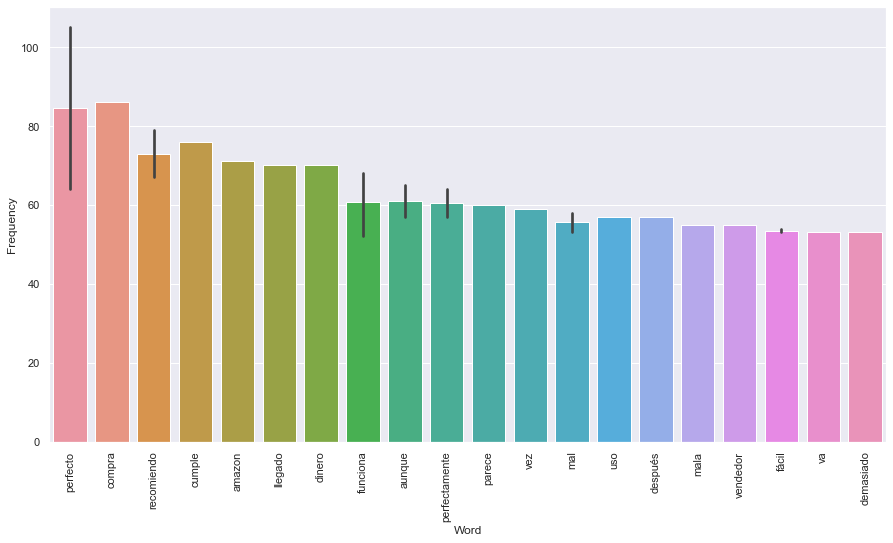

In [67]:
plt.figure(figsize = (15,8))
plot = sns.barplot(x  = df_token.iloc[:30].Word, y = df_token.iloc[:30].Frequency)
for item in plot.get_xticklabels():
    item.set_rotation(90)
plt.show()

Aplicaremos este filtro a la exploración de los titulos de los reviews para observar posibles cambios.

In [68]:
def token_npl(dataset, stopwords, star):
    title_reviews = []
    calification = []
    for i in range(dataset.shape[0]):
        title = dataset.iloc[i].review_title.lower()
        title = nltk.tokenize.RegexpTokenizer("[\w]+").tokenize(title)
        title = [word for word in title if word not in stopwords]
        title = [word for word in title if word not in filtrar]

        title_reviews.append(title)
        calification.append(star)
        
    title_reviews = list(itertools.chain(*title_reviews))
    freq_tl = nltk.FreqDist(title_reviews)
    df_tl = pd.DataFrame(list(freq_tl.items()), columns = ["Word","Frequency"])
    df_tl['Calification'] = star
    df_tl.sort_values('Frequency',ascending=False, inplace = True)
    df_tl.reset_index(drop = True, inplace=True)
        
    return df_tl

In [69]:
df_one = token_npl(one_star, stopwords, 1)
df_one.head(5)

,Word,Frequency,Calification
0,mala,48,1
1,mal,37,1
2,funciona,27,1
3,roto,22,1
4,llegado,20,1


In [70]:
df_two = token_npl(two_star, stopwords, 2)
df_two.head()

,Word,Frequency,Calification
0,mala,46,2
1,mal,29,2
2,poca,23,2
3,funciona,22,2
4,esperaba,20,2


In [71]:
df_three = token_npl(three_star, stopwords, 3)
df_three.head()

,Word,Frequency,Calification
0,mal,36,3
1,regular,27,3
2,correcto,24,3
3,bonito,18,3
4,bueno,15,3


In [72]:
df_r_four = token_npl(four_star, stopwords, 4)
df_r_four.head(5)

,Word,Frequency,Calification
0,bueno,30,4
1,perfecto,29,4
2,relación,28,4
3,compra,23,4
4,cumple,22,4


In [73]:
df_five = token_npl(five_star, stopwords, 5)
df_five.head()

,Word,Frequency,Calification
0,perfecto,70,5
1,compra,38,5
2,excelente,33,5
3,genial,26,5
4,bueno,25,5


Encontramos que con la lista de palabras para filtrar si es posible observar algunas relaciones entre palabras clave en los reviews y title reviews y la calificación del usuario al producto.

## 3. Stemming

Se aplicará una técnica de stemming al dataset final para observar comportamientos y relaciones.

In [74]:
dataset_dev.head()

,review_id,product_id,reviewer_id,stars,review_body,review_title,language,product_category,text
0,es_0417480,product_es_0873923,reviewer_es_0672978,1,"Malisimo, muy grande demasiado aparatoso y mal...",Mala compra,es,wireless,"[mala, compra]"
1,es_0180432,product_es_0713146,reviewer_es_0100858,1,No he recibido el pedido no la devolución,No lo he recibido,es,apparel,"[no, lo, he, recibido]"
2,es_0144850,product_es_0356874,reviewer_es_0486447,1,"Tengo que buscar otro sistema, este no funcion...",Que no aprieta bien en el manillar,es,sports,"[que, no, aprieta, bien, en, el, manillar]"
3,es_0339629,product_es_0939832,reviewer_es_0894703,1,Utilicé las brocas de menor diámetro y se me d...,Brocas de mantequilla,es,home_improvement,"[brocas, de, mantequilla]"
4,es_0858362,product_es_0489066,reviewer_es_0887663,1,No me gusta su olor a viejo y aspecto malo,No me gusta,es,beauty,"[no, me, gusta]"


In [75]:
dataset=pd.concat([dataset_dev.stars,dataset_dev.review_body,dataset_dev.review_title,dataset_dev.product_category],axis=1)
dataset.dropna(axis=0,inplace=True)  # Si hay alguna nan, tiramos esa instancia
dataset.head()

,stars,review_body,review_title,product_category
0,1,"Malisimo, muy grande demasiado aparatoso y mal...",Mala compra,wireless
1,1,No he recibido el pedido no la devolución,No lo he recibido,apparel
2,1,"Tengo que buscar otro sistema, este no funcion...",Que no aprieta bien en el manillar,sports
3,1,Utilicé las brocas de menor diámetro y se me d...,Brocas de mantequilla,home_improvement
4,1,No me gusta su olor a viejo y aspecto malo,No me gusta,beauty


Dado que en nuestro tenemos reviews, los signos de exclamacion y pregunta no son relevantes.

## 3.1 Para Title Review

In [76]:
# Importamos esta libreria que nos permite reemplzar caracteres
import re

# Importamos la función que nos permite Stemmizar de nltk y definimos el stemmer
from nltk.stem import PorterStemmer
stemmer = PorterStemmer()

# Traemos nuevamente las stopwords
stopwords = nltk.corpus.stopwords.words('spanish')
stopwords.remove('no')

In [77]:
# Recorremos todos los titulos y le vamos aplicando la Normalizacion y luega el Stemming a cada uno
titular_list=[]
for titular in dataset.review_title:
    # Vamos a reemplzar los caracteres que no sean leras por espacios
    titular=re.sub("[^a-zA-Z]"," ",str(titular))
    # Pasamos todo a minúsculas
    titular=titular.lower()
    # Tokenizamos para separar las palabras del titular
    titular=nltk.word_tokenize(titular)
    # Eliminamos las palabras de menos de 3 letras
    titular = [palabra for palabra in titular if len(palabra)>3]
    # Sacamos las Stopwords
    titular = [palabra for palabra in titular if not palabra in stopwords]
    
    ## Hasta acá Normalizamos, ahora a stemmizar
    
    # Aplicamos la funcion para buscar la raiz de las palabras
    titular=[stemmer.stem(palabra) for palabra in titular]
    # Por ultimo volvemos a unir el titular
    titular=" ".join(titular)
    
    # Vamos armando una lista con todos los titulares
    titular_list.append(titular)
    
dataset["title_review_nr"] = titular_list

In [78]:
dataset.tail()

,stars,review_body,review_title,product_category,title_review_nr
4995,5,Me ha encantado la cesta. Ha llegado impecable...,guadalupe,home,guadalup
4996,5,Desempeña su función correctamente,calidad precio,camera,calidad precio
4997,5,Me ha encantado la diadema! Las flores son tal...,Excelente,toy,excelent
4998,5,"A mi me gustan mucho las fundas TPU, ya que so...",Genial,wireless,genial
4999,5,El artículo ha cumplido con las expectativas q...,Buena calidad,apparel,buena calidad


## 3.2 Para Body Review

In [79]:
# Recorremos todos los titulos y le vamos aplicando la Normalizacion y luega el Stemming a cada uno
titular_list=[]
for titular in dataset.review_body:
    # Vamos a reemplzar los caracteres que no sean leras por espacios
    titular=re.sub("[^a-zA-Z]"," ",str(titular))
    # Pasamos todo a minúsculas
    titular=titular.lower()
    # Tokenizamos para separar las palabras del titular
    titular=nltk.word_tokenize(titular)
    # Eliminamos las palabras de menos de 3 letras
    titular = [palabra for palabra in titular if len(palabra)>3]
    # Sacamos las Stopwords
    titular = [palabra for palabra in titular if not palabra in stopwords]
    
    ## Hasta acá Normalizamos, ahora a stemmizar
    
    # Aplicamos la funcion para buscar la raiz de las palabras
    titular=[stemmer.stem(palabra) for palabra in titular]
    # Por ultimo volvemos a unir el titular
    titular=" ".join(titular)
    
    # Vamos armando una lista con todos los titulares
    titular_list.append(titular)
    
dataset["body_review_nr"] = titular_list

In [80]:
dataset.tail()

,stars,review_body,review_title,product_category,title_review_nr,body_review_nr
4995,5,Me ha encantado la cesta. Ha llegado impecable...,guadalupe,home,guadalup,encantado cesta llegado impec tama util pesa f...
4996,5,Desempeña su función correctamente,calidad precio,camera,calidad precio,desemp funci correctament
4997,5,Me ha encantado la diadema! Las flores son tal...,Excelente,toy,excelent,encantado diadema flore vienen imagen aplastad...
4998,5,"A mi me gustan mucho las fundas TPU, ya que so...",Genial,wireless,genial,gustan funda funda normalment fina colorida ha...
4999,5,El artículo ha cumplido con las expectativas q...,Buena calidad,apparel,buena calidad,culo cumplido expectativa deseaba


In [81]:
del dataset['review_body']
del dataset['review_title']

## 3.3 Dataset Normalizado

In [82]:
dataset.head()

,stars,product_category,title_review_nr,body_review_nr
0,1,wireless,mala compra,malisimo grand demasiado aparatoso protector p...
1,1,apparel,recibido,recibido pedido devoluci
2,1,sports,aprieta bien manillar,buscar sistema funciona bien abrazadera lleva ...
3,1,home_improvement,broca mantequilla,util broca menor metro doblaron varia mantequi...
4,1,beauty,gusta,gusta olor viejo aspecto malo


### 3.3.1 Exploracion dataset normalizado

#### 3.3.2 Title Review

Redefinimos la funcion, quitamos el comentario de stopwords y filtro para observar como se comporta.

In [83]:
def token_npl(dataset, stopwords, star):
    title_reviews = []
    calification = []
    for i in range(dataset.shape[0]):
        title = dataset.iloc[i].title_review_nr.lower()
        title = nltk.tokenize.RegexpTokenizer("[\w]+").tokenize(title)
        #title = [word for word in title if word not in stopwords]
        #title = [word for word in title if word not in filtrar]

        title_reviews.append(title)
        calification.append(star)
        
    title_reviews = list(itertools.chain(*title_reviews))
    freq_tl = nltk.FreqDist(title_reviews)
    df_tl = pd.DataFrame(list(freq_tl.items()), columns = ["Word","Frequency"])
    df_tl['Calification'] = star
    df_tl.sort_values('Frequency',ascending=False, inplace = True)
    df_tl.reset_index(drop = True, inplace=True)
        
    return df_tl

In [84]:
df_nr = token_npl(dataset, stopwords, 1)
del df_nr['Calification']
df_nr.head(10)

,Word,Frequency
0,calidad,402
1,bien,309
2,buena,245
3,precio,230
4,producto,194
5,buen,190
6,mala,110
7,perfecto,105
8,bueno,97
9,compra,84


**Exploracion por calificacion**

In [85]:
one_star_nr = dataset[dataset.stars==1]
df_one_nr = token_npl(one_star_nr, stopwords, 1)
df_one_nr.head(5)

,Word,Frequency,Calification
0,calidad,56,1
1,mala,53,1
2,producto,53,1
3,funciona,27,1
4,roto,23,1


In [86]:
two_star_nr = dataset[dataset.stars==2]
df_two_nr = token_npl(two_star_nr, stopwords, 2)
df_two_nr.head(5)

,Word,Frequency,Calification
0,calidad,85,2
1,bien,52,2
2,mala,47,2
3,poca,25,2
4,producto,24,2


In [87]:
three_star_nr = dataset[dataset.stars==3]
df_three_nr = token_npl(three_star_nr, stopwords, 3)
df_three_nr.head(5)

,Word,Frequency,Calification
0,bien,97,3
1,calidad,66,3
2,precio,58,3
3,buena,35,3
4,regular,28,3


In [88]:
four_star_nr = dataset[dataset.stars==4]
df_four_nr = token_npl(four_star_nr, stopwords, 4)
df_four_nr.head(5)

,Word,Frequency,Calification
0,buena,114,4
1,calidad,99,4
2,bien,99,4
3,precio,90,4
4,buen,70,4


In [89]:
five_star_nr = dataset[dataset.stars==5]
df_five_nr = token_npl(five_star_nr, stopwords, 5)
df_five_nr.head(5)

,Word,Frequency,Calification
0,calidad,96,5
1,buen,85,5
2,buena,77,5
3,perfecto,71,5
4,producto,53,5


Se observan algunas palabras poco relevantes como "producto". Incluso es posible pensar que palabras como "bien", "mal", "malo" entregan poca informacion respecto a la clasificacion.

#### 3.3.2 Body Review

In [90]:
def token_npl(dataset, stopwords, star):
    title_reviews = []
    calification = []
    for i in range(dataset.shape[0]):
        title = dataset.iloc[i].body_review_nr.lower()
        title = nltk.tokenize.RegexpTokenizer("[\w]+").tokenize(title)
        #title = [word for word in title if word not in stopwords]
        #title = [word for word in title if word not in filtrar]

        title_reviews.append(title)
        calification.append(star)
        
    title_reviews = list(itertools.chain(*title_reviews))
    freq_tl = nltk.FreqDist(title_reviews)
    df_tl = pd.DataFrame(list(freq_tl.items()), columns = ["Word","Frequency"])
    df_tl['Calification'] = star
    df_tl.sort_values('Frequency',ascending=False, inplace = True)
    df_tl.reset_index(drop = True, inplace=True)
        
    return df_tl

In [91]:
df_nr_bd = token_npl(dataset, stopwords, 1)
del df_nr_bd['Calification']
df_nr_bd.head(10)

,Word,Frequency
0,bien,1329
1,calidad,794
2,producto,643
3,precio,590
4,buena,510
5,pequ,340
6,bastant,336
7,funciona,282
8,buen,279
9,parec,274


**Exploracion por calificacion**

In [92]:
one_star_nr_bd = dataset[dataset.stars==1]
df_one_nr_bd = token_npl(one_star_nr_bd, stopwords, 1)
df_one_nr_bd.head(5)

,Word,Frequency,Calification
0,producto,212,1
1,bien,123,1
2,calidad,90,1
3,recomiendo,79,1
4,amazon,71,1


In [93]:
two_star_nr_bd = dataset[dataset.stars==2]
df_two_nr_bd = token_npl(two_star_nr_bd, stopwords, 1)
df_two_nr_bd.head(5)

,Word,Frequency,Calification
0,bien,229,1
1,calidad,151,1
2,producto,108,1
3,precio,87,1
4,pequ,83,1


In [94]:
three_star_nr_bd = dataset[dataset.stars==3]
df_three_nr_bd = token_npl(three_star_nr_bd, stopwords, 1)
df_three_nr_bd.head(5)

,Word,Frequency,Calification
0,bien,354,1
1,calidad,168,1
2,precio,139,1
3,pequ,92,1
4,producto,90,1


In [95]:
four_star_nr_bd = dataset[dataset.stars==4]
df_four_nr_bd = token_npl(four_star_nr_bd, stopwords, 1)
df_four_nr_bd.head(5)

,Word,Frequency,Calification
0,bien,371,1
1,precio,184,1
2,calidad,176,1
3,buena,153,1
4,producto,124,1


In [96]:
five_star_nr_bd = dataset[dataset.stars==5]
df_five_nr_bd = token_npl(five_star_nr_bd, stopwords, 1)
df_five_nr_bd.head(5)

,Word,Frequency,Calification
0,bien,252,1
1,calidad,209,1
2,buena,182,1
3,precio,148,1
4,buen,120,1


Palabras como "bien", "produco", "calidad" se siguen repitiendo en cada clasificacion de manera repetitiva.

## 4. Lemmatization

In [97]:
#nltk.download()

In [98]:
# Importamos esta libreria que nos permite reemplzar caracteres
import re

# Importamos el lemmatizar de NLTK, y creamos el objeto
from nltk.stem import WordNetLemmatizer
wordnet_lemmatizer = WordNetLemmatizer()

In [99]:
dataset_dev.head()

,review_id,product_id,reviewer_id,stars,review_body,review_title,language,product_category,text
0,es_0417480,product_es_0873923,reviewer_es_0672978,1,"Malisimo, muy grande demasiado aparatoso y mal...",Mala compra,es,wireless,"[mala, compra]"
1,es_0180432,product_es_0713146,reviewer_es_0100858,1,No he recibido el pedido no la devolución,No lo he recibido,es,apparel,"[no, lo, he, recibido]"
2,es_0144850,product_es_0356874,reviewer_es_0486447,1,"Tengo que buscar otro sistema, este no funcion...",Que no aprieta bien en el manillar,es,sports,"[que, no, aprieta, bien, en, el, manillar]"
3,es_0339629,product_es_0939832,reviewer_es_0894703,1,Utilicé las brocas de menor diámetro y se me d...,Brocas de mantequilla,es,home_improvement,"[brocas, de, mantequilla]"
4,es_0858362,product_es_0489066,reviewer_es_0887663,1,No me gusta su olor a viejo y aspecto malo,No me gusta,es,beauty,"[no, me, gusta]"


## 4.1 Lemmatization para Title Review

Como se observó en el análisis exploratorio anterior, la palabra "no" suele generar inconvenientes en el análisis del modelo para la exploración.

In [100]:
dataset = pd.concat([dataset_dev.review_title,dataset_dev.stars,dataset_dev.review_body],axis=1)
dataset.dropna(axis=0,inplace=True)

# Traemos nuevamente las stopwords
stopwords = nltk.corpus.stopwords.words('spanish')
stopwords.remove('no')

In [101]:
stopwords

['de',
 'la',
 'que',
 'el',
 'en',
 'y',
 'a',
 'los',
 'del',
 'se',
 'las',
 'por',
 'un',
 'para',
 'con',
 'una',
 'su',
 'al',
 'lo',
 'como',
 'más',
 'pero',
 'sus',
 'le',
 'ya',
 'o',
 'este',
 'sí',
 'porque',
 'esta',
 'entre',
 'cuando',
 'muy',
 'sin',
 'sobre',
 'también',
 'me',
 'hasta',
 'hay',
 'donde',
 'quien',
 'desde',
 'todo',
 'nos',
 'durante',
 'todos',
 'uno',
 'les',
 'ni',
 'contra',
 'otros',
 'ese',
 'eso',
 'ante',
 'ellos',
 'e',
 'esto',
 'mí',
 'antes',
 'algunos',
 'qué',
 'unos',
 'yo',
 'otro',
 'otras',
 'otra',
 'él',
 'tanto',
 'esa',
 'estos',
 'mucho',
 'quienes',
 'nada',
 'muchos',
 'cual',
 'poco',
 'ella',
 'estar',
 'estas',
 'algunas',
 'algo',
 'nosotros',
 'mi',
 'mis',
 'tú',
 'te',
 'ti',
 'tu',
 'tus',
 'ellas',
 'nosotras',
 'vosotros',
 'vosotras',
 'os',
 'mío',
 'mía',
 'míos',
 'mías',
 'tuyo',
 'tuya',
 'tuyos',
 'tuyas',
 'suyo',
 'suya',
 'suyos',
 'suyas',
 'nuestro',
 'nuestra',
 'nuestros',
 'nuestras',
 'vuestro',
 'vue

In [102]:
from nltk.corpus import wordnet

def get_wordnet_pos(word):
    """Map POS tag to first character lemmatize() accepts"""
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}

    return tag_dict.get(tag, wordnet.NOUN)

In [103]:
titular_list=[]
for titular in dataset.review_title:
    # Vamos a reemplzar los caracteres que no sean leras por espacios
    titular=re.sub("[^a-zA-Z]"," ",str(titular))
    # Pasamos todo a minúsculas
    titular=titular.lower()
    # Tokenizamos para separar las palabras
    titular=nltk.word_tokenize(titular)
    
    # Aplicamos el Lemmatizer (Esto puede tardar un ratito)
    frase_lemma = [wordnet_lemmatizer.lemmatize(w, get_wordnet_pos(w)) for w in titular]
    
    # Sacamos las Stopwords
    titular = [palabra for palabra in titular if not palabra in stopwords]
    
    # Por ultimo volvemos a unir el titular
    titular=" ".join(titular)
    #dataset["titular_normalizado"] = titular_list
    titular_list.append(titular)

Luego del tokenizado, realizamos una impresión de la data. Este análisis comprende el título del review.

In [104]:
dataset["title_review_lm"] = titular_list
dataset.head()

,review_title,stars,review_body,title_review_lm
0,Mala compra,1,"Malisimo, muy grande demasiado aparatoso y mal...",mala compra
1,No lo he recibido,1,No he recibido el pedido no la devolución,no recibido
2,Que no aprieta bien en el manillar,1,"Tengo que buscar otro sistema, este no funcion...",no aprieta bien manillar
3,Brocas de mantequilla,1,Utilicé las brocas de menor diámetro y se me d...,brocas mantequilla
4,No me gusta,1,No me gusta su olor a viejo y aspecto malo,no gusta


In [105]:
dataset_lemm = pd.concat([dataset.title_review_lm,dataset.stars],axis=1)
#dataset_lemm.dropna(axis=0,inplace=True)  # Por si quedaron campos vacios
dataset_lemm.head()

,title_review_lm,stars
0,mala compra,1
1,no recibido,1
2,no aprieta bien manillar,1
3,brocas mantequilla,1
4,no gusta,1


In [106]:
titular_list=[]
for titular in dataset.review_body:
    # Vamos a reemplzar los caracteres que no sean leras por espacios
    titular=re.sub("[^a-zA-Z]"," ",str(titular))
    # Pasamos todo a minúsculas
    titular=titular.lower()
    # Tokenizamos para separar las palabras
    titular=nltk.word_tokenize(titular)
    
    # Aplicamos el Lemmatizer (Esto puede tardar un ratito)
    frase_lemma = [wordnet_lemmatizer.lemmatize(w, get_wordnet_pos(w)) for w in titular]
    
    # Sacamos las Stopwords
    titular = [palabra for palabra in titular if not palabra in stopwords]
    
    # Por ultimo volvemos a unir el titular
    titular=" ".join(titular)
    #dataset["titular_normalizado"] = titular_list
    titular_list.append(titular)

In [107]:
dataset["body_review_lm"] = titular_list
dataset.head()

,review_title,stars,review_body,title_review_lm,body_review_lm
0,Mala compra,1,"Malisimo, muy grande demasiado aparatoso y mal...",mala compra,malisimo grande demasiado aparatoso mal protec...
1,No lo he recibido,1,No he recibido el pedido no la devolución,no recibido,no recibido pedido no devoluci n
2,Que no aprieta bien en el manillar,1,"Tengo que buscar otro sistema, este no funcion...",no aprieta bien manillar,buscar sistema no funciona bien abrazadera lle...
3,Brocas de mantequilla,1,Utilicé las brocas de menor diámetro y se me d...,brocas mantequilla,utilic brocas menor di metro doblaron varias s...
4,No me gusta,1,No me gusta su olor a viejo y aspecto malo,no gusta,no gusta olor viejo aspecto malo


In [108]:
dataset_lemm = pd.concat([dataset.body_review_lm,dataset.title_review_lm,dataset.stars],axis=1)
dataset_lemm.head()

,body_review_lm,title_review_lm,stars
0,malisimo grande demasiado aparatoso mal protec...,mala compra,1
1,no recibido pedido no devoluci n,no recibido,1
2,buscar sistema no funciona bien abrazadera lle...,no aprieta bien manillar,1
3,utilic brocas menor di metro doblaron varias s...,brocas mantequilla,1
4,no gusta olor viejo aspecto malo,no gusta,1


In [109]:
dataset_lemm.dropna(axis=0,inplace=True)  # Por si quedaron campos vacios

In [110]:
dataset_lemm.head()

,body_review_lm,title_review_lm,stars
0,malisimo grande demasiado aparatoso mal protec...,mala compra,1
1,no recibido pedido no devoluci n,no recibido,1
2,buscar sistema no funciona bien abrazadera lle...,no aprieta bien manillar,1
3,utilic brocas menor di metro doblaron varias s...,brocas mantequilla,1
4,no gusta olor viejo aspecto malo,no gusta,1


**Exploracion por calificacion**

In [111]:
df_one_lm = dataset_lemm[dataset_lemm.stars==1]
df_one_lm.head(5)

,body_review_lm,title_review_lm,stars
0,malisimo grande demasiado aparatoso mal protec...,mala compra,1
1,no recibido pedido no devoluci n,no recibido,1
2,buscar sistema no funciona bien abrazadera lle...,no aprieta bien manillar,1
3,utilic brocas menor di metro doblaron varias s...,brocas mantequilla,1
4,no gusta olor viejo aspecto malo,no gusta,1


In [112]:
df_two_lm = dataset_lemm[dataset_lemm.stars==2]
df_two_lm.head(5)

,body_review_lm,title_review_lm,stars
1000,enviado completamente diferente m diferencia f...,mal,2
1001,menos semanas uso mangas roto no sido po engan...,baja calidad producto,2
1002,hicimos pedido barrera ah bien llego pod is ve...,decepcionados embalaje er art culo,2
1003,queda grande no s puede arreglar gracias,mas menos,2
1004,d as uso roto pulsador puesta marcha correa da...,poca calidad,2


In [113]:
df_three_lm = dataset_lemm[dataset_lemm.stars==3]
df_three_lm.head(5)

,body_review_lm,title_review_lm,stars
2000,gusto color tejido calidad espuma recomendable,encaja,3
2001,llegado r pido m s peque pensaba no caben tant...,simple,3
2002,gustado producto,buen producto,3
2003,despega r pido hecho sido cocerlo,bien,3
2004,no parece tampoco especifico animales aprieto ...,basico,3


In [114]:
df_four_lm = dataset_lemm[dataset_lemm.stars==4]
df_four_lm.head(5)

,body_review_lm,title_review_lm,stars
3000,robustas francamente cumplen cometido juego ll...,gran juego llaves,4
3001,estupenda relaci n calidad precio,funcional,4
3002,compr madre contenta compacto f cil usar excep...,compacto c modo,4
3003,estrecho vale pintura,bien,4
3004,doy cuatro estrellas n no probado d as llevo w...,nice,4


In [115]:
df_five_lm = dataset_lemm[dataset_lemm.stars==5]
df_five_lm.head(5)

,body_review_lm,title_review_lm,stars
4000,pareja encantada adquisici n pr ctico til tal ...,til ligero hace papel,5
4001,cuanto compr gato olvid rascar sof,funciona,5
4002,caf excelente calidad c psulas aluminio compos...,c psulas compatibles maquina nespresso recicla...,5
4003,atrapa primer minuto lectura f cil r pida reco...,atrapa,5
4004,est bien montado resulta vistoso gusta recomiendo,pedido,5


## Procesamiento 

### Ajuste de la data para usar en los modelos 

In [116]:
data_ml=dataset_dev[['review_title','review_body','stars']]

Para el procesamiento se tomarán tanto los titulos como el cuerpo del review.

In [117]:
#filtrado de palabras 
data_ml['tokens']=tokenizer(data_ml,'review_title')
data_ml['tokens']=data_ml['tokens'].apply(lambda x:[word for word in x if word not in stopwords])
data_ml['title_procesado']=data_ml['tokens'].apply(lambda x:' '.join(x))
data_ml['tokens']=tokenizer(data_ml,'review_body')
data_ml['tokens']=data_ml['tokens'].apply(lambda x:[word for word in x if word not in stopwords])
data_ml['body_procesado']=data_ml['tokens'].apply(lambda x:' '.join(x))
data_ml

<ipython-input-20-0364dec16bf5>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-20-0364dec16bf5>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-117-148acdc7a6d3>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-117-148ac

,review_title,review_body,stars,text,tokens,title_procesado,body_procesado
0,Mala compra,"Malisimo, muy grande demasiado aparatoso y mal...",1,"[malisimo, muy, grande, demasiado, aparatoso, ...","[malisimo, grande, demasiado, aparatoso, mal, ...",mala compra,malisimo grande demasiado aparatoso mal protec...
1,No lo he recibido,No he recibido el pedido no la devolución,1,"[no, he, recibido, el, pedido, no, la, devoluc...","[no, recibido, pedido, no, devolución]",no recibido,no recibido pedido no devolución
2,Que no aprieta bien en el manillar,"Tengo que buscar otro sistema, este no funcion...",1,"[tengo, que, buscar, otro, sistema, este, no, ...","[buscar, sistema, no, funciona, bien, abrazade...",no aprieta bien manillar,buscar sistema no funciona bien abrazadera lle...
3,Brocas de mantequilla,Utilicé las brocas de menor diámetro y se me d...,1,"[utilicé, las, brocas, de, menor, diámetro, y,...","[utilicé, brocas, menor, diámetro, doblaron, v...",brocas mantequilla,utilicé brocas menor diámetro doblaron varias ...
4,No me gusta,No me gusta su olor a viejo y aspecto malo,1,"[no, me, gusta, su, olor, a, viejo, y, aspecto...","[no, gusta, olor, viejo, aspecto, malo]",no gusta,no gusta olor viejo aspecto malo
...,...,...,...,...,...,...,...
4995,guadalupe,Me ha encantado la cesta. Ha llegado impecable...,5,"[me, ha, encantado, la, cesta, ha, llegado, im...","[encantado, cesta, llegado, impecable, tamaño,...",guadalupe,encantado cesta llegado impecable tamaño util ...
4996,calidad precio,Desempeña su función correctamente,5,"[desempeña, su, función, correctamente]","[desempeña, función, correctamente]",calidad precio,desempeña función correctamente
4997,Excelente,Me ha encantado la diadema! Las flores son tal...,5,"[me, ha, encantado, la, diadema, las, flores, ...","[encantado, diadema, flores, tal, vienen, imag...",excelente,encantado diadema flores tal vienen imagen no ...
4998,Genial,"A mi me gustan mucho las fundas TPU, ya que so...",5,"[a, mi, me, gustan, mucho, las, fundas, tpu, y...","[gustan, fundas, tpu, fundas, normalmente, fin...",genial,gustan fundas tpu fundas normalmente finas col...


Como primer paso paso para un buen procesamiento vamos a asighnar etiquetas a nuestro conjunto de palabras, para ello usaremos la libreria Stanza de la universidad de Stanford la cual ya tiene unos algoritmos internos basados en redes neuronales para establecer estas etiquetas, usaremos estas etiquetas ya que con nltk fallamos en las tildes por ser en ingles, mientras stanza posee un lemmatizado y asignado de etiquetas para español 

In [118]:
#instalamos stanza
#!pip install stanza

In [119]:
import stanza 
#descargamos las librerias de stanzas para español 
stanza.download('es')

2021-08-22 09:43:18 INFO: Downloading default packages for language: es (Spanish)...
2021-08-22 09:43:23 INFO: File exists: C:\Users\Jean Piere Castro\stanza_resources\es\default.zip.
2021-08-22 09:43:34 INFO: Finished downloading models and saved to C:\Users\Jean Piere Castro\stanza_resources.


In [120]:
#le decimos a estanza en el pipeline los procesos que queremos que haga con nuestro texto 
nlp=stanza.Pipeline('es',processors='tokenize,mwt,pos,lemma')

2021-08-22 09:43:34 INFO: Loading these models for language: es (Spanish):
| Processor | Package |
-----------------------
| tokenize  | ancora  |
| mwt       | ancora  |
| pos       | ancora  |
| lemma     | ancora  |

2021-08-22 09:43:34 INFO: Use device: cpu
2021-08-22 09:43:34 INFO: Loading: tokenize
2021-08-22 09:43:35 INFO: Loading: mwt
2021-08-22 09:43:35 INFO: Loading: pos
2021-08-22 09:43:36 INFO: Loading: lemma
2021-08-22 09:43:37 INFO: Done loading processors!


In [121]:
type(dataset_dev.review_title[0])

str

In [122]:
def lemmatizer(data,columna):
    text_lemma=data[columna].apply(lambda x: nlp(x))
    return text_lemma

### Lemmatizacion para titles

In [123]:
text_titles=lemmatizer(data_ml,'review_title')


C:\Users\Jean Piere Castro\anaconda3\lib\site-packages\torch\_tensor.py:575: UserWarning:

floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  ..\aten\src\ATen\native\BinaryOps.cpp:467.)



In [124]:
tagged_titles=text_titles.apply(lambda x:[(word.text,word.pos) for sentence in x.sentences for word in sentence.words])
tagged_titles

0                           [(Mala, ADJ), (compra, NOUN)]
1       [(No, ADV), (lo, PRON), (he, AUX), (recibido, ...
2       [(Que, SCONJ), (no, ADV), (aprieta, VERB), (bi...
3        [(Brocas, NOUN), (de, ADP), (mantequilla, NOUN)]
4                  [(No, ADV), (me, PRON), (gusta, VERB)]
                              ...                        
4995                                  [(guadalupe, NOUN)]
4996                    [(calidad, NOUN), (precio, NOUN)]
4997                                   [(Excelente, ADJ)]
4998                                      [(Genial, ADJ)]
4999                      [(Buena, ADJ), (calidad, NOUN)]
Name: review_title, Length: 5000, dtype: object

In [125]:
lemma_titles=text_titles.apply(lambda x:[word.lemma for sent in x.sentences for word in sent.words])
lemma_titles

0                                   [mala, compra]
1                         [no, él, haber, recibir]
2       [que, no, apritar, bien, en, el, manillar]
3                         [broca, de, mantequilla]
4                                 [no, yo, gustar]
                           ...                    
4995                                   [guadalupe]
4996                             [calidad, precio]
4997                                   [excelente]
4998                                      [genial]
4999                               [buen, calidad]
Name: review_title, Length: 5000, dtype: object

### Lematizacion para bodies 

In [126]:
text_bodies=lemmatizer(data_ml,'review_body')

In [127]:
tagged_bodies=text_bodies.apply(lambda x:[(word.text,word.pos) for sentence in x.sentences for word in sentence.words])
tagged_bodies

0       [(Malisimo, VERB), (,, PUNCT), (muy, ADV), (gr...
1       [(No, ADV), (he, AUX), (recibido, VERB), (el, ...
2       [(Tengo, VERB), (que, SCONJ), (buscar, VERB), ...
3       [(Utilicé, VERB), (las, DET), (brocas, NOUN), ...
4       [(No, ADV), (me, PRON), (gusta, VERB), (su, DE...
                              ...                        
4995    [(Me, PRON), (ha, AUX), (encantado, VERB), (la...
4996    [(Desempeña, VERB), (su, DET), (función, NOUN)...
4997    [(Me, PRON), (ha, AUX), (encantado, VERB), (la...
4998    [(A, ADP), (mi, DET), (me, PRON), (gustan, VER...
4999    [(El, DET), (artículo, NOUN), (ha, AUX), (cump...
Name: review_body, Length: 5000, dtype: object

In [128]:
lemm_bodies=text_bodies.apply(lambda x:[word.lemma for sent in x.sentences for word in sent.words])
lemm_bodies

0       [malisenar, ,, mucho, grande, demasiado, apara...
1       [no, haber, recibir, el, pedido, no, el, devol...
2       [tener, que, buscar, otro, sistema, ,, este, n...
3       [utilizar, el, broca, de, menor, diámetro, y, ...
4       [no, yo, gustar, su, olor, a, viejo, y, aspect...
                              ...                        
4995    [yo, haber, encantado, el, cesta, ., haber, ll...
4996             [desempeñar, su, función, correctamente]
4997    [yo, haber, encantado, el, diadema, !, el, flo...
4998    [a, mi, yo, gustar, mucho, el, funda, TPU, ,, ...
4999    [el, artículo, haber, cumplir, con, el, expect...
Name: review_body, Length: 5000, dtype: object

In [129]:
#aparecen signos de puntuacion que no queremos
lemm_bodies=lemm_bodies.apply(lambda x:[word for word in x if len(word)>1])
lemm_bodies

0       [malisenar, mucho, grande, demasiado, aparatos...
1       [no, haber, recibir, el, pedido, no, el, devol...
2       [tener, que, buscar, otro, sistema, este, no, ...
3       [utilizar, el, broca, de, menor, diámetro, él,...
4        [no, yo, gustar, su, olor, viejo, aspecto, malo]
                              ...                        
4995    [yo, haber, encantado, el, cesta, haber, llega...
4996             [desempeñar, su, función, correctamente]
4997    [yo, haber, encantado, el, diadema, el, flor, ...
4998    [mi, yo, gustar, mucho, el, funda, TPU, ya, qu...
4999    [el, artículo, haber, cumplir, con, el, expect...
Name: review_body, Length: 5000, dtype: object

In [130]:
data_ml["titular_lemm"] =lemma_titles 
data_ml['body_lemm']=lemm_bodies
data_ml

<ipython-input-130-1a55b431e025>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,review_title,review_body,stars,text,tokens,title_procesado,body_procesado,titular_lemm,body_lemm
0,Mala compra,"Malisimo, muy grande demasiado aparatoso y mal...",1,"[malisimo, muy, grande, demasiado, aparatoso, ...","[malisimo, grande, demasiado, aparatoso, mal, ...",mala compra,malisimo grande demasiado aparatoso mal protec...,"[mala, compra]","[malisenar, mucho, grande, demasiado, aparatos..."
1,No lo he recibido,No he recibido el pedido no la devolución,1,"[no, he, recibido, el, pedido, no, la, devoluc...","[no, recibido, pedido, no, devolución]",no recibido,no recibido pedido no devolución,"[no, él, haber, recibir]","[no, haber, recibir, el, pedido, no, el, devol..."
2,Que no aprieta bien en el manillar,"Tengo que buscar otro sistema, este no funcion...",1,"[tengo, que, buscar, otro, sistema, este, no, ...","[buscar, sistema, no, funciona, bien, abrazade...",no aprieta bien manillar,buscar sistema no funciona bien abrazadera lle...,"[que, no, apritar, bien, en, el, manillar]","[tener, que, buscar, otro, sistema, este, no, ..."
3,Brocas de mantequilla,Utilicé las brocas de menor diámetro y se me d...,1,"[utilicé, las, brocas, de, menor, diámetro, y,...","[utilicé, brocas, menor, diámetro, doblaron, v...",brocas mantequilla,utilicé brocas menor diámetro doblaron varias ...,"[broca, de, mantequilla]","[utilizar, el, broca, de, menor, diámetro, él,..."
4,No me gusta,No me gusta su olor a viejo y aspecto malo,1,"[no, me, gusta, su, olor, a, viejo, y, aspecto...","[no, gusta, olor, viejo, aspecto, malo]",no gusta,no gusta olor viejo aspecto malo,"[no, yo, gustar]","[no, yo, gustar, su, olor, viejo, aspecto, malo]"
...,...,...,...,...,...,...,...,...,...
4995,guadalupe,Me ha encantado la cesta. Ha llegado impecable...,5,"[me, ha, encantado, la, cesta, ha, llegado, im...","[encantado, cesta, llegado, impecable, tamaño,...",guadalupe,encantado cesta llegado impecable tamaño util ...,[guadalupe],"[yo, haber, encantado, el, cesta, haber, llega..."
4996,calidad precio,Desempeña su función correctamente,5,"[desempeña, su, función, correctamente]","[desempeña, función, correctamente]",calidad precio,desempeña función correctamente,"[calidad, precio]","[desempeñar, su, función, correctamente]"
4997,Excelente,Me ha encantado la diadema! Las flores son tal...,5,"[me, ha, encantado, la, diadema, las, flores, ...","[encantado, diadema, flores, tal, vienen, imag...",excelente,encantado diadema flores tal vienen imagen no ...,[excelente],"[yo, haber, encantado, el, diadema, el, flor, ..."
4998,Genial,"A mi me gustan mucho las fundas TPU, ya que so...",5,"[a, mi, me, gustan, mucho, las, fundas, tpu, y...","[gustan, fundas, tpu, fundas, normalmente, fin...",genial,gustan fundas tpu fundas normalmente finas col...,[genial],"[mi, yo, gustar, mucho, el, funda, TPU, ya, qu..."


# Modelos de Machine Learning
    
El proceso de modelado constará de 4 pasos principales que abarcaran desde el preporcesamiento, hasta la aplicacion de los   modelos de machine learning.

1. Tokenización: Se utilizaran las columnas review body y review_title del dataset para entrenar el modelo, a estas columnas habrá que tokenizarlas, y para ello se utilizaran dos metodos, usando expresiones regulares y utilizando la libreria Spacy.
2. Con el fin de disminuir el tamaño del corpus se empelaran tecnicas de filtros con expresiones regulares y stopwords para descartar caracteres y palabras inoficiosas para el procesamiento.
3. En la primera etapa observamos que hay algunos ngramas que se repiten y dan indicios de la calificación obtenida, asi que como atributo escogeremos estos ngramas y armaremos un dataset de atributos target para entrenar el modelo.
4. Por cuestion de gustos y por ser un problema de clasifiacion entrenaremos el modelo primeramente con un randomforest, teniendo como metrica el acurricy. 




In [131]:
pd.DataFrame(data_ml.body_lemm.values)

,0
0,"[malisenar, mucho, grande, demasiado, aparatos..."
1,"[no, haber, recibir, el, pedido, no, el, devol..."
2,"[tener, que, buscar, otro, sistema, este, no, ..."
3,"[utilizar, el, broca, de, menor, diámetro, él,..."
4,"[no, yo, gustar, su, olor, viejo, aspecto, malo]"
...,...
4995,"[yo, haber, encantado, el, cesta, haber, llega..."
4996,"[desempeñar, su, función, correctamente]"
4997,"[yo, haber, encantado, el, diadema, el, flor, ..."
4998,"[mi, yo, gustar, mucho, el, funda, TPU, ya, qu..."


In [132]:
data_ml['ngramas']=data_ml['body_lemm'].apply(lambda x:list(ngrams(x,3)))
all_ngrams=[ngrama for lista_ngramas in data_ml['ngramas'] for ngrama in lista_ngramas ]
fdist_ngrams=nltk.FreqDist(all_ngrams)
top_ngrams = fdist_ngrams.most_common(300)#ngramas

def document_features(document):
    #document_ngrams = set(document)
    features = {}
    for ngram,i in top_ngrams:
        features['contains({})'.format(ngram)] = (ngram in document)
    return features

In [133]:
data_ml=data_ml.sample(frac=1).reset_index(drop=True)
data_ml.head()

,review_title,review_body,stars,text,tokens,title_procesado,body_procesado,titular_lemm,body_lemm,ngramas
0,buen producto,no era lo que necesitaba. pero calidad muy buena,2,"[no, era, lo, que, necesitaba, pero, calidad, ...","[no, necesitaba, calidad, buena]",buen producto,no necesitaba calidad buena,"[buen, producto]","[no, ser, él, que, necesitar, pero, calidad, m...","[(no, ser, él), (ser, él, que), (él, que, nece..."
1,Falta bolsa para guardarla,No ha venido con bolsa para guardarla. En la o...,1,"[no, ha, venido, con, bolsa, para, guardarla, ...","[no, venido, bolsa, guardarla, ocasión, anteri...",falta bolsa guardarla,no venido bolsa guardarla ocasión anterior com...,"[faltar, bolsa, para, guardar]","[no, haber, venir, con, bolsa, para, guardar, ...","[(no, haber, venir), (haber, venir, con), (ven..."
2,Ha sido muy util pero se ha roto en un mes.,La mochila me ha resultado muy util durante un...,2,"[la, mochila, me, ha, resultado, muy, util, du...","[mochila, resultado, util, viaje, mes, bonita,...",sido util roto mes,mochila resultado util viaje mes bonita espaci...,"[haber, ser, mucho, util, pero, él, haber, rom...","[el, mochila, yo, haber, resultar, mucho, util...","[(el, mochila, yo), (mochila, yo, haber), (yo,..."
3,Muy bonita,La gente cuando la ven se quedan flipados la h...,5,"[la, gente, cuando, la, ven, se, quedan, flipa...","[gente, ven, quedan, flipados, puesto, comedor...",bonita,gente ven quedan flipados puesto comedor da se...,"[mucho, bonito]","[el, gente, cuando, él, ver, él, quedar, flipa...","[(el, gente, cuando), (gente, cuando, él), (cu..."
4,Para uso infantil suficiente,Son de plastico y la calidad de la imagen muy ...,4,"[son, de, plastico, y, la, calidad, de, la, im...","[plastico, calidad, imagen, mala, peto, compre...",uso infantil suficiente,plastico calidad imagen mala peto compre dos n...,"[para, uso, infantil, suficiente]","[ser, de, plastico, el, calidad, de, el, image...","[(ser, de, plastico), (de, plastico, el), (pla..."


## Modelo BenchMark 

Generaremos un modelo de benchmark partiendo por vectorizar por ngramas.

In [134]:
#Vectorizacion por ngramas
fset= [(document_features(texto),estrellas) for texto, estrellas in zip(data_ml['ngramas'].values, data_ml['stars'].values)]

In [135]:
train, test = fset[:3500], fset[3500:]
classifier = nltk.NaiveBayesClassifier.train(train)

In [136]:
print(nltk.classify.accuracy(classifier, test))

0.31733333333333336


### ¿Qué información está usando el módelo para predecir?

In [137]:
classifier.show_most_informative_features(5)

Most Informative Features
contains(('no', 'él', 'recomer')) = True                1 : 4      =     24.9 : 1.0
contains(('no', 'yo', 'haber')) = True                1 : 5      =     15.9 : 1.0
contains(('estar', 'mucho', 'bien')) = True                4 : 1      =     15.4 : 1.0
contains(('por', 'él', 'demás')) = True                3 : 5      =     15.2 : 1.0
contains(('tener', 'que', 'devolver')) = True                2 : 5      =     14.3 : 1.0


Al parecer la vectorizacion por trigramas no es tan efectiva, sin embargo las caracteristicas que esta usando el modelo dan indicio de si el comentario es bueno o malo, el problema está en la subjetividad. Por ejemplo  lo que es 5 estrellas para una persona puede ser un comentario con las mismas palabras pero 4 estrellas para otra persona.Haremos otro modelo benchmark con solo palabras y despues utilizaremos sckit learn para emplear modelos mas avanzados.

## Modelo Benchmark 2

Se realiza de nuevo la vectorización para mejorar la precisión del modelo en su entrenamiento.

In [138]:
#Modificamos los atributios para la vectorización 
#filtramos las palabras con stopwords
#stopwords

all_words = nltk.FreqDist([w for tokenlist in data_ml['body_lemm'].values for w in tokenlist])
top_words = all_words.most_common(200)

def document_features(document):
    document_words = set(document)
    features = {}
    for word,i in top_words:
        features['contains({})'.format(word)] = (word in document_words)
    return features

In [139]:
#Vectorizacion por ngramas
fset = [(document_features(texto), estrellas) for texto, estrellas in zip(data_ml['body_lemm'].values, data_ml['stars'].values)]


In [140]:
train, test = fset[:3500], fset[3500:]
classifier = nltk.NaiveBayesClassifier.train(train)
print(nltk.classify.accuracy(classifier, test))

0.39266666666666666


In [141]:
classifier.show_most_informative_features(5)

Most Informative Features
 contains(perfectamente) = True                5 : 1      =     28.2 : 1.0
      contains(relación) = True                4 : 1      =     24.4 : 1.0
      contains(contento) = True                5 : 2      =     21.1 : 1.0
        contains(romper) = True                2 : 5      =     20.9 : 1.0
      contains(perfecto) = True                5 : 1      =     18.5 : 1.0


## Modelos Avanzados 

En esta sección aplicaremos modelos avanzados como randomforest y tambien tecnicas de optimizacion y tokenizacion mas avanzada, donde tendremos en cuenta emojis, usaremos librerias como spacy, sklearn entre otras y trataremos de mejorar el accuracy partiendo de los modelos benchmarks 

In [142]:
#from nltk.tokenize.casual import TweetTokenizer
#tokenizador=TweetTokenizer()
#dataset_dev['strings']=dataset_dev['review_body'].apply(lambda x:str(x))
#dataset_dev['tokens']=dataset_dev['strings'].apply(lambda x: tokenizador.tokenize(x))
#dataset_dev['tokens']

In [143]:
# Tomamos la lista de palabras y el vector que nos dice las estrellas 
list_bodies = list(data_ml['body_procesado'].values)
estrellas = data_ml['stars'].values

In [144]:
from sklearn.feature_extraction.text import CountVectorizer

# Usaremos solo las 1000 palabras con mas frecuencia en todo el corpus para generar los vectores
max_features=10000

# Es decir que cada instancia tendrá 1000 features
cou_vec=CountVectorizer(max_features=max_features, analyzer='word', ngram_range=(1,1)) 

In [145]:
matriz_bodies=cou_vec.fit_transform(list_bodies)

# Tomamos las palabras
all_words = cou_vec.get_feature_names()

# Vizualizamos las 50 ngramas mas usadas
print("50 ngramas mas usados: ",all_words[0:50])
print('*************************************')
print(matriz_bodies.toarray())


50 ngramas mas usados:  ['10', '100', '1000', '100x100', '1080', '10cm', '10mm', '11', '12', '125', '12m', '12v', '12º', '13', '130', '135', '14', '15', '150', '150w', '150x190', '15h', '15min', '16', '160', '16gb', '17', '18', '180', '180gr', '18kg', '18º', '19', '1a', '1h', '1º', '20', '200', '2000', '20000', '2001', '2006', '2007', '200w', '2011', '2017', '2018', '2019', '20ml', '21']
*************************************
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [146]:
x = matriz_bodies.toarray()
y = estrellas

from sklearn.model_selection import train_test_split
xtrain, xtest, ytrain, ytest = train_test_split(x,y,test_size=0.2,random_state=42,stratify=y)

## Modelo avanzado 1: Random Forest

In [147]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix

rf = RandomForestClassifier(n_estimators = 1000, random_state=42)
rf.fit(xtrain,ytrain)
print("acc: ",rf.score(xtest,ytest))

acc:  0.433


Realizando una optimización de hiperparámetros.

In [258]:
#Generamos la grilla
parametros = {'n_estimators':sp.stats.randint(10, 1000), #40x50
              'max_depth': [sp.stats.randint(2,100),None], 
              'max_features':['auto', 'sqrt','log2'],
              'min_samples_split':sp.stats.randint(2, 10),
              'min_samples_leaf':sp.stats.randint(2, 10),
              'criterion':['gini', 'entropy']}

In [259]:
bosque = RandomForestClassifier()
modelo = RandomizedSearchCV(bosque, parametros, n_iter = 20, n_jobs =-1, random_state=0,cv = 5,scoring='r2')

In [260]:
modelo.fit(xtrain, ytrain)

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_iter=20,
                   n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [<scipy.stats._distn_infrastructure.rv_frozen object at 0x0000017D4F6F2820>,
                                                      None],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000017D4F6F26D0>,
                                        'min_samples_split': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000017D4F7001F0>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000017D4F700A30>},
                   random_state=0, scoring='r2')

In [261]:
print("Mejores parametros: "+str(modelo.best_params_))
print("Mejor Score: "+str(modelo.best_score_)+'\n')

scores = pd.DataFrame(modelo.cv_results_)

Mejores parametros: {'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 773}
Mejor Score: 0.08854166666666677



Evaluamos el modelo.

In [262]:
rf = RandomForestClassifier(criterion = 'gini', 
                            max_depth= None, 
                            max_features= 'sqrt', 
                            min_samples_leaf= 2, 
                            min_samples_split= 5, 
                            n_estimators= 773, 
                            random_state=42)
rf.fit(xtrain,ytrain)
print("acc: ",rf.score(xtest,ytest))

acc:  0.806


El modelo final, con un Accuary del 80 %, logra llegar a un nivel de precisión que, aunque no es muy alto (consideraríamos que es posible trabajar aun más el procesamiento) es un porcentaje realmente aceptable. Ahora revisaremos las palabras más importantes al momento de decidir.

In [264]:
def confusion(ytest,y_pred):
    names=["Malo","Bueno"]
    cm=confusion_matrix(ytest,y_pred)
    f,ax=plt.subplots(figsize=(5,5))
    sns.heatmap(cm,annot=True,linewidth=.5,linecolor="r",fmt=".0f",ax=ax)
    plt.xlabel("y_pred")
    plt.ylabel("y_true")
    ax.set_xticklabels(names)
    ax.set_yticklabels(names)
    plt.show()

    return

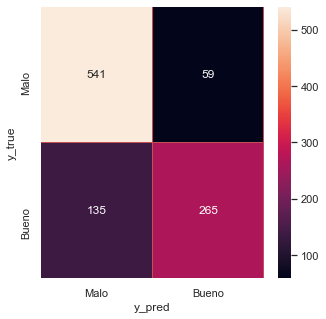

In [265]:
y_pred=rf.predict(xtest)
confusion(ytest,y_pred)

Con la matriz de confusión observamos una mejora sustancial en el modelo.

C:\Users\Jean Piere Castro\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



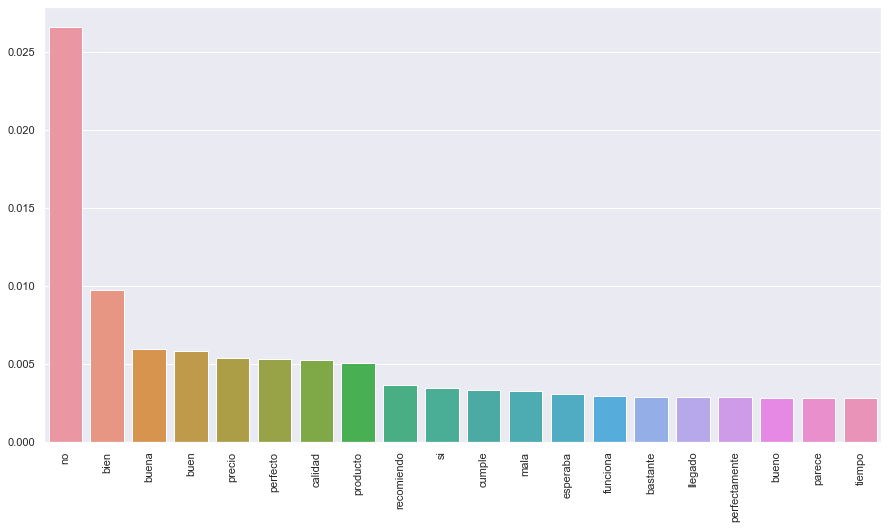

In [148]:
# Le preguntamos la importancia de cada feature (cada palabra)
importances = rf.feature_importances_
# Tomamos la lista de palabras
all_words = cou_vec.get_feature_names()
columns = all_words

# Ordenamos por importnacia y tomamos las 20 primeras
indices = np.argsort(importances)[::-1]
indices = indices[:20]
selected_columns = [columns[i] for i in indices]
selected_importances = importances[indices]

# Por ultimo graficamos
plt.figure(figsize = (15,8))
plot=sns.barplot(selected_columns, selected_importances)
for item in plot.get_xticklabels():
    item.set_rotation(90)
plt.show()

## SVC

In [149]:
from sklearn.svm import LinearSVC

svc = LinearSVC(C = 1)
svc.fit(xtrain,ytrain)
svc.score(xtest,ytest)

0.401

Para la parte del análisis multiclase no se obsevró un accuary relativamente alto. En esta parte nos sorprendió bastante encontrar este comportamiento debido a que en la exploración de n-gramas inicial algunas palabras en conjunto denotaban un sentido más claro de la calificación más allá que la palabra de forma individual.

Aun así, podemos concluir que los n-gramas permiten las clasificaciones positivas y negativas entre productos pero genera ciertos inconvenientes o dualidades a la hora de enseñarle al modelo a predecir el número de estrellas.

### Para pensar, investigar y, opcionalmente, implementar
1. ¿Valdrá la pena convertir el problema de Machine Learning en un problema binario? Es decir, asignar únicamente las etiquetas Positiva y Negativa a cada crítica y hacer un modelo que, en lugar de predecir las estrellas, prediga esa etiqueta. Pensar en qué situación puede ser útil. ¿Esperas que el desempeño sea mejor o peor?
1. ¿Hay algo que te gustaría investigar o probar?

##### Lo que pensamos:

1. Si valdría la pena. Aun con el uso de n-gramas en donde obtenemos combinaciones que nos dan indicios muy fiables de qué tan a gusto o no se sintió el cliente con el producto, sigue siendo borrosa la linea diferenciadora entre un número de estrellas y otro. Esto lo logramos comprobar con el accuary final del modelo que, por lo visto no fue muy bueno. Las reseñas críticas o positivas, entendiendose por ejemplo pulgar arriba o pulgar abajo sería más util para darle un información concreta al cliente. De por si, la linea diferenciado entre 3, 4 y 5 estrellas puede ser muy subjetiva entre clientes. Este uso de una calificación directa positiva o negativa puede resultar util en elecciones en las que el usuario no deba de pensarlo mucho, por ejemplo, elecciones de peliculas, series, videos, un platillo de un restauraunte; elecciones donde un reseña unica positiva o negativa puede resultar ser diferenciadora en la opinión final. Contrario a productos que por su precio y características requieren calificaciones menos generales cómo dispositivos electronicos, autos, viviendas, etc. Por último, la linea entre un mal o buen producto puede ser más fácil de marcar por el uso de palabras o adjetivos negativos o sentimientos como ira, rechazo o ironía.

2. Para el proyecto queremos implementar esta mejora a partir de redes neuronales multicapa que permita al sistena evaluar estas etiquetas positivas o negativas.

## Problema binario 

Convertiremos el problema en un problema de sentimientos donde reduciremos los target a buen comentario 'b' y a comentario malo 'm'. Para ello definiremos como bueno aquellos comentarios que tengan una calificacion de estrellas de 4 y 5 y como malos aquelos con 1,2 y 3 

In [150]:
c_buenos=[4,5]
c_malos=[1,2,3]
data_ml['feel']=data_ml['stars'].apply(lambda x: 1 if x in c_buenos else 0)

In [151]:
# Tomamos la lista de palabras y el vector que nos dice las estrellas 
list_bodies = list(data_ml['body_procesado'].values)
feel = data_ml['feel'].values

In [152]:
from sklearn.feature_extraction.text import CountVectorizer

# Usaremos solo las 1000 palabras con mas frecuencia en todo el corpus para generar los vectores
#max_features=10000

# Es decir que cada instancia tendrá 1000 features
#cou_vec=CountVectorizer(max_features=max_features, analyzer='word', ngram_range=(2,2)) 

#trigramas

# Usaremos solo las 1000 palabras con mas frecuencia en todo el corpus para generar los vectores
max_features=10000

# Es decir que cada instancia tendrá 1000 features
cou_vec=CountVectorizer(max_features=max_features, analyzer='word', ngram_range=(1,1)) 

In [153]:
matriz_bodies=cou_vec.fit_transform(list_bodies)

# Tomamos las palabras
all_words = cou_vec.get_feature_names()

# Vizualizamos las 50 ngramas mas usadas
print("50 ngramas mas usados: ",all_words[0:50])
print('*************************************')
print(matriz_bodies.toarray())


50 ngramas mas usados:  ['10', '100', '1000', '100x100', '1080', '10cm', '10mm', '11', '12', '125', '12m', '12v', '12º', '13', '130', '135', '14', '15', '150', '150w', '150x190', '15h', '15min', '16', '160', '16gb', '17', '18', '180', '180gr', '18kg', '18º', '19', '1a', '1h', '1º', '20', '200', '2000', '20000', '2001', '2006', '2007', '200w', '2011', '2017', '2018', '2019', '20ml', '21']
*************************************
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


Realizamos los conjuntos de trainy test.

In [154]:
x = matriz_bodies.toarray()
y = feel

from sklearn.model_selection import train_test_split
xtrain, xtest, ytrain, ytest = train_test_split(x,y,test_size=0.2,random_state=42,stratify=y)

Generamos nuestro arbol clasificador.

In [155]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix

rf = RandomForestClassifier(n_estimators = 100, random_state=42)
rf.fit(xtrain,ytrain)
print("acc: ",rf.score(xtest,ytest))

acc:  0.796


En el caso de un problema binario, encontramos mejoras significativos frente al problema de identificación de estrellas. Creemos que la subjetividad es menor frente al entendiendo de las palabras buenas o malas. Permitiendo al modelo definir una linea divisoria entre estas dos clasificaciones un poco más clara.

C:\Users\Jean Piere Castro\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



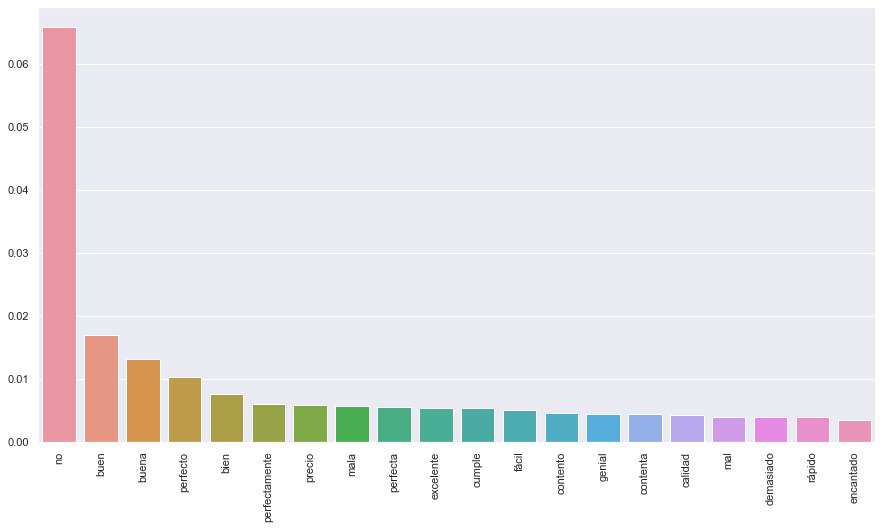

In [156]:
# Le preguntamos la importancia de cada feature (cada palabra)
importances = rf.feature_importances_
# Tomamos la lista de palabras
all_words = cou_vec.get_feature_names()
columns = all_words

# Ordenamos por importnacia y tomamos las 20 primeras
indices = np.argsort(importances)[::-1]
indices = indices[:20]
selected_columns = [columns[i] for i in indices]
selected_importances = importances[indices]

# Por ultimo graficamos
plt.figure(figsize = (15,8))
plot=sns.barplot(selected_columns, selected_importances)
for item in plot.get_xticklabels():
    item.set_rotation(90)
plt.show()

Las palabras "no", "bueno", "malo", "precio", "perfecto" son las más comunes para definir esta clasificación binaria. 

In [157]:
def confusion(ytest,y_pred):
    names=["Malo","Bueno"]
    cm=confusion_matrix(ytest,y_pred)
    f,ax=plt.subplots(figsize=(5,5))
    sns.heatmap(cm,annot=True,linewidth=.5,linecolor="r",fmt=".0f",ax=ax)
    plt.xlabel("y_pred")
    plt.ylabel("y_true")
    ax.set_xticklabels(names)
    ax.set_yticklabels(names)
    plt.show()

    return

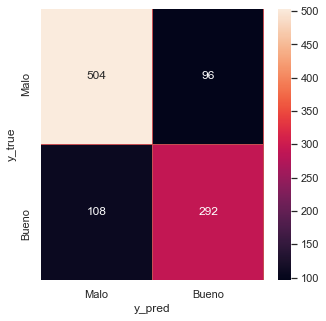

In [158]:
y_pred=rf.predict(xtest)
confusion(ytest,y_pred)

De la anterior matriz de confusión, observamos que el modelo no tiene una gran diferencia frente a la identificación de buenas o malas reseñas. Creemos que las palabras seleccionadas puedes usarse en contexto ambiguos donde un "no" acompañado por sustantivos como calidad, precio, etc puede referirse a una mala reseña y no a una buena.

### Implementación de una red neuronal multicapa

Cómo punto adicional, implementaremos una red neuronal multicapa y observaremos si varia su resultado en este problema de clasificación binaria.

In [159]:
xtrain

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [160]:
ytrain

array([0, 0, 1, ..., 1, 1, 1], dtype=int64)

##### Importe de librerias

In [161]:
# Modelado
# ==============================================================================
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
import multiprocessing

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

Partiremos de 4 modelos con distintas capas de profundidad.

In [162]:
# Modelos
# ==============================================================================
modelo_1 = MLPClassifier(
                hidden_layer_sizes=(5),
                learning_rate_init=0.01,
                solver = 'lbfgs',
                max_iter = 1000,
                random_state = 123
            )

modelo_2 = MLPClassifier(
                hidden_layer_sizes=(10),
                learning_rate_init=0.01,
                solver = 'lbfgs',
                max_iter = 1000,
                random_state = 123
            )

modelo_3 = MLPClassifier(
                hidden_layer_sizes=(20, 20),
                learning_rate_init=0.01,
                solver = 'lbfgs',
                max_iter = 5000,
                random_state = 123
            )

modelo_4 = MLPClassifier(
                hidden_layer_sizes=(50, 50, 50),
                learning_rate_init=0.01,
                solver = 'lbfgs',
                max_iter = 5000,
                random_state = 123
            )

modelo_1.fit(X=xtrain, y=ytrain)
modelo_2.fit(X=xtrain, y=ytrain)
modelo_3.fit(X=xtrain, y=ytrain)
modelo_4.fit(X=xtrain, y=ytrain)

MLPClassifier(hidden_layer_sizes=(50, 50, 50), learning_rate_init=0.01,
              max_iter=5000, random_state=123, solver='lbfgs')

Ajustaremos mediante un GridSearch el número de neuronas a partir del accuary.

In [163]:
# Número de neuronas
# ==============================================================================
param_grid = {'hidden_layer_sizes':[1, 5, 10, 15, 25, 50]}

grid = GridSearchCV(
        estimator = MLPClassifier(
                        learning_rate_init=0.01,
                        solver = 'lbfgs',
                        alpha  = 0,
                        max_iter = 5000,
                        random_state = 123
                    ),
        param_grid = param_grid,
        scoring    = 'accuracy',
        cv         = 5,
        refit      = True,
        return_train_score = True
      )

_ = grid.fit(xtrain, ytrain)

### Exploración del entrenamiento de la red neuronal

Exploraremos cómo se comporta la validación cruzada a partir del Accuary. 

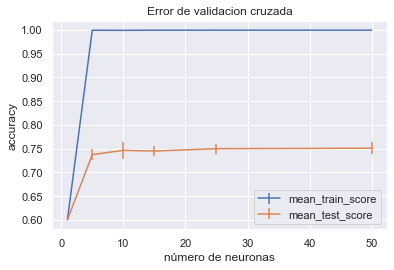

In [164]:
fig, ax = plt.subplots(figsize=(6, 3.84))
scores = pd.DataFrame(grid.cv_results_)
scores.plot(x='param_hidden_layer_sizes', y='mean_train_score', yerr='std_train_score', ax=ax)
scores.plot(x='param_hidden_layer_sizes', y='mean_test_score', yerr='std_test_score', ax=ax)
ax.set_ylabel('accuracy')
ax.set_xlabel('número de neuronas')
ax.set_title('Error de validacion cruzada');

El accuary no parece mejorar con más de 25 neuronas para el conjunto test.

Ahora analizaremos el rate de aprendizaje para nuestra red.

In [174]:
# learning rate
# ==============================================================================
param_grid = {'learning_rate_init':[0.0001, 0.001, 0.01, 0.1, 1, 10, 100]}

grid = GridSearchCV(
        estimator = MLPClassifier(
                        hidden_layer_sizes=(10),
                        solver = 'adam',
                        alpha  = 0,
                        max_iter = 5000,
                        random_state = 123
                    ),
        param_grid = param_grid,
        scoring    = 'accuracy',
        cv         = 5,
        refit      = True,
        return_train_score = True
      )

_ = grid.fit(xtrain, ytrain)

Generamos la gráfica.

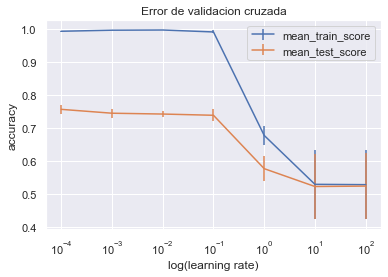

In [175]:
fig, ax = plt.subplots(figsize=(6, 3.84))
scores = pd.DataFrame(grid.cv_results_)
scores.plot(x='param_learning_rate_init', y='mean_train_score', yerr='std_train_score', ax=ax)
scores.plot(x='param_learning_rate_init', y='mean_test_score', yerr='std_test_score', ax=ax)
ax.set_xscale('log')
ax.set_xlabel('log(learning rate)')
ax.set_ylabel('accuracy')
ax.set_title('Error de validacion cruzada');

Observamos que el campo en los hiperparámetros y su accuary se ve afectado por combinaciones distintas de estos mismos. 

#### Optimización de hiperparámetros

La optimización de hiperparámetros se realizará a bajo nivel primero por el tiempo de computación. AUn así resaltamos que distintas combinaciones de estos hiperparámetros arrojarían accuary distinto y dada las limitancias computaciones es posible que los valores explorados representen un espacio de posibilidades relativamente menor y que existirían combinaciones que logren un mejor accuary en el modelo final.

In [176]:
# Espacio de búsqueda de cada hiperparámetro
# ==============================================================================
param_distributions = {
    'hidden_layer_sizes': [(5), (10, 10), (15, 15)],
    'alpha': np.logspace(-3, 3, 7),
    'learning_rate_init': [0.001, 0.01, 0.1],
}

# Búsqueda por validación cruzada
# ==============================================================================
grid = RandomizedSearchCV(
        estimator  = MLPClassifier(solver = 'lbfgs', max_iter= 20),
        param_distributions = param_distributions,
        n_iter     = 10, # Número máximo de combinaciones probadas
        scoring    = 'accuracy',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = 3, 
        verbose    = 0,
        random_state = 123,
        return_train_score = True
       )

grid.fit(X = xtrain, y = ytrain)

# Resultados del grid
# ==============================================================================
resultados = pd.DataFrame(grid.cv_results_)
resultados.filter(regex = '(param.*|mean_t|std_t)')\
    .drop(columns = 'params')\
    .sort_values('mean_test_score', ascending = False)\
    .head(10)

,param_learning_rate_init,param_hidden_layer_sizes,param_alpha,mean_test_score,std_test_score,mean_train_score,std_train_score
4,0.01,"(15, 15)",10.0,0.779001,0.010549,0.897627,0.020728
7,0.01,"(10, 10)",10.0,0.778251,0.005619,0.905754,0.028738
9,0.01,"(10, 10)",0.01,0.777249,0.006944,0.891124,0.025752
1,0.001,"(10, 10)",10.0,0.773749,0.006052,0.939375,0.010410
0,0.001,"(15, 15)",0.1,0.771250,0.002082,0.918255,0.027001
2,0.001,"(15, 15)",0.01,0.769249,0.005534,0.939876,0.021525
3,0.01,"(10, 10)",1.0,0.768250,0.001649,0.945999,0.015773
6,0.001,5,0.1,0.766503,0.007170,0.969126,0.018018
5,0.001,5,1000.0,0.600000,0.000212,0.600000,0.000106
8,0.001,"(10, 10)",1000.0,0.600000,0.000212,0.600000,0.000106


Tomamos los hiperparámetros para el mejor estimador.

In [177]:
modelo = grid.best_estimator_
modelo

MLPClassifier(alpha=10.0, hidden_layer_sizes=(15, 15), learning_rate_init=0.01,
              max_iter=20, solver='lbfgs')

Y predecimos.

In [239]:
predicciones = modelo.predict(xtest)

Probamos el resultado a partir de una matriz de confusión.

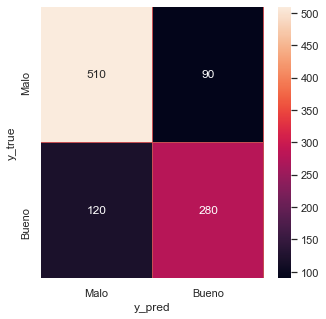

In [240]:
ypred = predicciones
confusion(ytest,ypred)

Observamos que el modelo final no difiere mucho del implementado en un inicio.

# Conclusión

El trabajo con procesamiento de texto abarca una labor de preprocesamiento mucho más extensa frente al manejo directo de data numérica o encodeada. Adicionalmente, las librerías para el procesamiento del español pueden presentar dificultados en el procesmaiento de tildes o caracteres especiales como emojis o emoticones.

Adicionalmente, cómo trabajo futuro, podemos resaltar la necesiadad de realizar un análisis individual por categoría para los reviews. Observamos que las palabras usadas para el entrenamiento del modelo suelen ser muy generales y podrían ser estos puntos en dónde el accuaracy baja. Por ejemplo, tal vez para el apartado de tecnología palabras, por nombrar un ejemplo, cómo "energía", "bateria", "precio" tengan una relevancia mayor frente a palabras en otras categorias como el hogar que podrían ser "color", "material", etc.